# Wine

## package load

In [1]:
# numerical calculation & data frames
import numpy as np
import pandas as pd

# visualization
import matplotlib.pyplot as plt
import seaborn as sns
import seaborn.objects as so


# statistics
import statsmodels.api as sm

# pandas options
pd.set_option("mode.copy_on_write", False) # pandas 2.0.0 이상
pd.options.display.precision = 2
pd.options.display.float_format = '{:.2f}'.format  # pd.reset_option('display.float_format')
pd.options.display.max_rows = 8

import sklearn

# For high resolution display
import matplotlib_inline
matplotlib_inline.backend_inline.set_matplotlib_formats("retina")

## dataset 핥기

In [2]:
wine = pd.read_csv("C:/Users/zezeg/Desktop/Wine_quality.csv")
wine1 = wine.copy()

In [3]:
wine1.head(5)

,index,quality,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,type
0,0,5,5.60,0.69,0.06,6.80,0.04,9.00,84.00,0.99,3.44,0.44,10.20,white
1,1,5,8.80,0.61,0.14,2.40,0.07,10.00,42.00,1.00,3.19,0.59,9.50,red
2,2,5,7.90,0.21,0.39,2.00,0.06,21.00,138.00,0.99,3.05,0.52,10.90,white
3,3,6,7.00,0.21,0.31,6.00,0.05,29.00,108.00,0.99,3.26,0.50,10.80,white
4,4,6,7.80,0.40,0.26,9.50,0.06,32.00,178.00,1.00,3.04,0.43,10.90,white


In [4]:
wine1.duplicated().sum()

# 겹치는 행 존재 - 다른 평가자의, 같은 와인 평가

0

In [5]:
wine1.info()

# non - null이므로, 스케일링이나 더미코딩만 잘 해주면 될듯

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5497 entries, 0 to 5496
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   index                 5497 non-null   int64  
 1   quality               5497 non-null   int64  
 2   fixed acidity         5497 non-null   float64
 3   volatile acidity      5497 non-null   float64
 4   citric acid           5497 non-null   float64
 5   residual sugar        5497 non-null   float64
 6   chlorides             5497 non-null   float64
 7   free sulfur dioxide   5497 non-null   float64
 8   total sulfur dioxide  5497 non-null   float64
 9   density               5497 non-null   float64
 10  pH                    5497 non-null   float64
 11  sulphates             5497 non-null   float64
 12  alcohol               5497 non-null   float64
 13  type                  5497 non-null   object 
dtypes: float64(11), int64(2), object(1)
memory usage: 601.4+ KB


quality가 int로 코딩되어 있는데, 이것을 카테고리화(순서가 존재하는 더미코딩) 시켜야 할지 살펴봐야겠다.

type은 더미코딩(순서의 개념이 없어도 됨) 해야 할 듯.

In [6]:
# 인덱스 제외한 숫자 데이터 간단히  확인
wine1 = wine1.drop(columns="index")
wine1.describe()

,quality,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
count,5497.00,5497.00,5497.00,5497.00,5497.00,5497.00,5497.00,5497.00,5497.00,5497.00,5497.00,5497.00
mean,5.82,7.21,0.34,0.32,5.44,0.06,30.42,115.57,0.99,3.22,0.53,10.50
std,0.87,1.29,0.16,0.15,4.76,0.03,17.67,56.29,0.00,0.16,0.15,1.19
min,3.00,3.80,0.08,0.00,0.60,0.01,1.00,6.00,0.99,2.74,0.22,8.00
25%,5.00,6.40,0.23,0.25,1.80,0.04,17.00,78.00,0.99,3.11,0.43,9.50
50%,6.00,7.00,0.29,0.31,3.00,0.05,29.00,118.00,0.99,3.21,0.51,10.30
75%,6.00,7.70,0.40,0.39,8.10,0.06,41.00,155.00,1.00,3.32,0.60,11.30
max,9.00,15.90,1.58,1.66,65.80,0.61,289.00,440.00,1.04,4.01,2.00,14.90


dioxide 부분에 대한 스케일링이 필요할듯 함.

residual sugar도 평균 5에 비해 매우 높은 max가 있어서 이상치에 대한 체크도 해야될 것 같음.

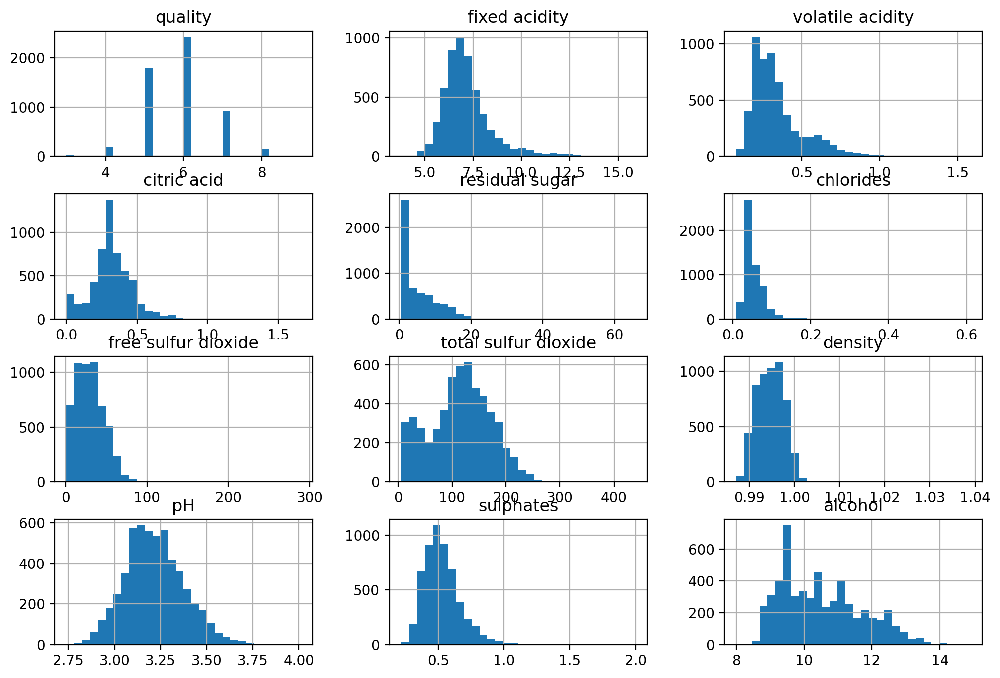

In [7]:
# 숫자 데이터 분포 HIST
wine1.hist(bins=30, figsize=(12,8))
plt.show()

# 일부는 오른쪽 꼬리가 김. 특히 fixed acidity, residual sugar...
# 특이하게 citric acid, ph 등등은 정규분포?
# alcohol - multimodal 처리
# 0.99에서 1 사이를 왔다갔다하는 density, 나머지들을 비교하였을 때 스케일링이 필요함을 다시 알 수 있음

명목형 파악

In [8]:
wine1["type"].value_counts()

# 화이트와 레드는  약 3:1비율

type
white    4159
red      1338
Name: count, dtype: int64

우리의 target인 quality 열을 살펴보자.

In [9]:
a = wine1["quality"].value_counts().sort_values().reset_index()
a.columns=["quality", "count"]
a

# 순서, 즉 quality의 높낮이에 따라 서로 연관이 있으니 사이킷런 ordinal encoder 사용 고려해봐야겠음.

# 불균형한 데이터셋(특정 quality의 개수가 매우 적음)이므로 계층 추출해야함.

,quality,count
0,9,5
1,3,26
2,8,152
3,4,186
4,7,924
5,5,1788
6,6,2416


In [10]:
b = len(wine1)
a["quality_ratio"] = a["count"] / b

a

,quality,count,quality_ratio
0,9,5,0.00
1,3,26,0.00
2,8,152,0.03
3,4,186,0.03
4,7,924,0.17
5,5,1788,0.33
6,6,2416,0.44


In [11]:
a = wine1.groupby(['quality', 'type']).size().unstack()

total_counts = a.sum(axis=1)

ratio = a.div(total_counts,axis=0)

ratio


type,red,white
quality,,
3,0.35,0.65
4,0.22,0.78
5,0.32,0.68
6,0.22,0.78
7,0.18,0.82
8,0.09,0.91
9,NaN,1.00


<Axes: xlabel='quality', ylabel='count'>

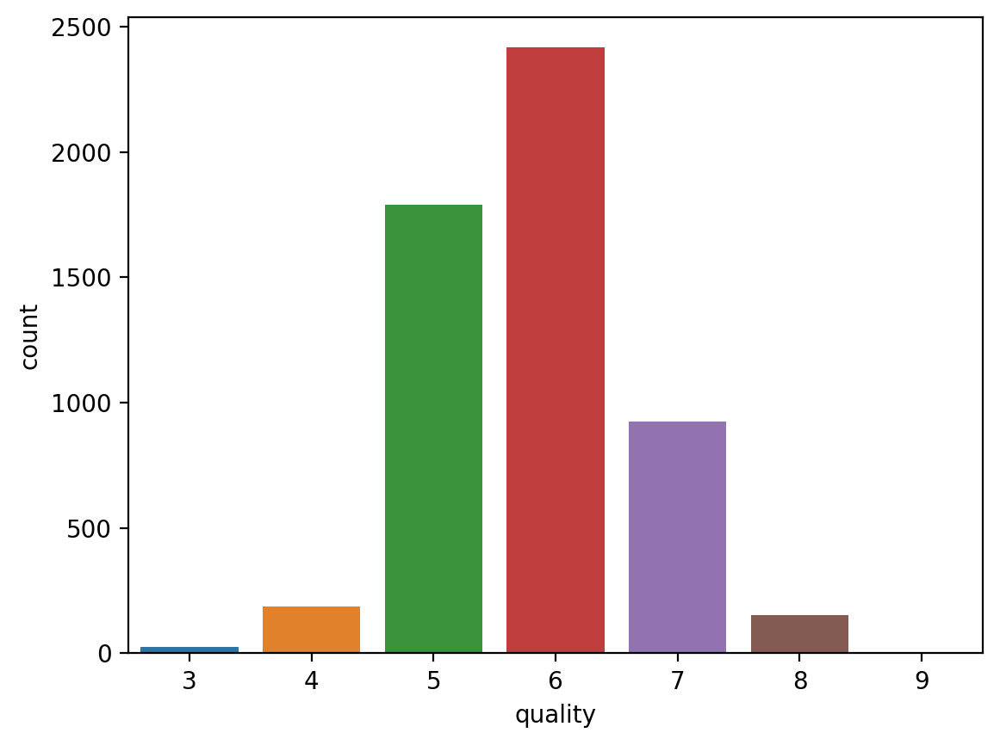

In [12]:
sns.countplot(x=wine1['quality'])


나머지는 다 숫자이고, red와 white라는 가장 기초적 특징이 있으니 이것부터 봐야겠다.

red

<Axes: xlabel='quality', ylabel='count'>

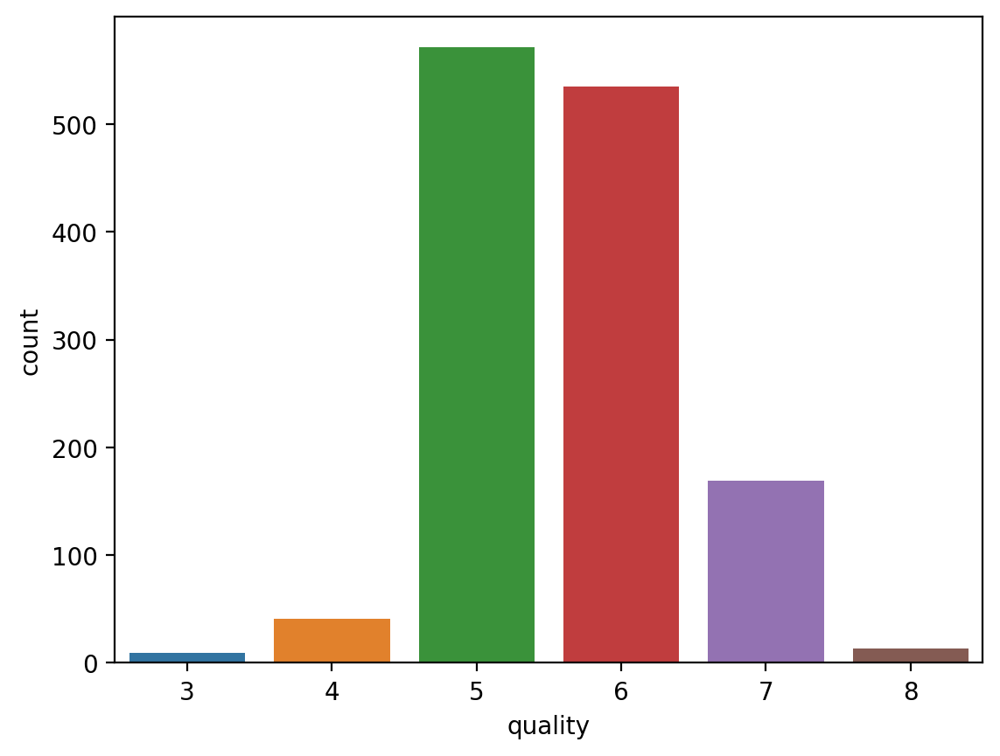

In [13]:
sns.countplot(x = wine1[wine1["type"]=="red"]["quality"])

# 5quality가 가장 많고, 6이 그다음.

# 5와 6이 대다수임

white

<Axes: xlabel='quality', ylabel='count'>

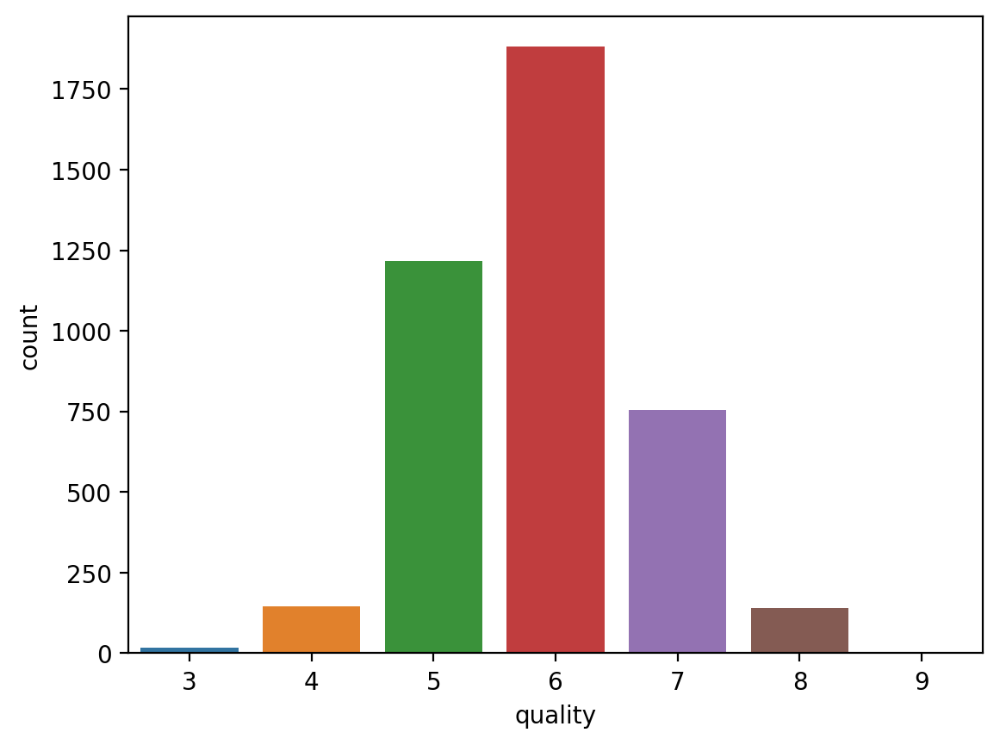

In [14]:
sns.countplot(x = wine1[wine1["type"]=="white"]["quality"])

# 약간 다른 분포를 보임. 6이 제일 많고 그다음 5

# 9가 존재

# 5 6 이 대다수임

In [15]:
wine1.head(5)

,quality,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,type
0,5,5.60,0.69,0.06,6.80,0.04,9.00,84.00,0.99,3.44,0.44,10.20,white
1,5,8.80,0.61,0.14,2.40,0.07,10.00,42.00,1.00,3.19,0.59,9.50,red
2,5,7.90,0.21,0.39,2.00,0.06,21.00,138.00,0.99,3.05,0.52,10.90,white
3,6,7.00,0.21,0.31,6.00,0.05,29.00,108.00,0.99,3.26,0.50,10.80,white
4,6,7.80,0.40,0.26,9.50,0.06,32.00,178.00,1.00,3.04,0.43,10.90,white


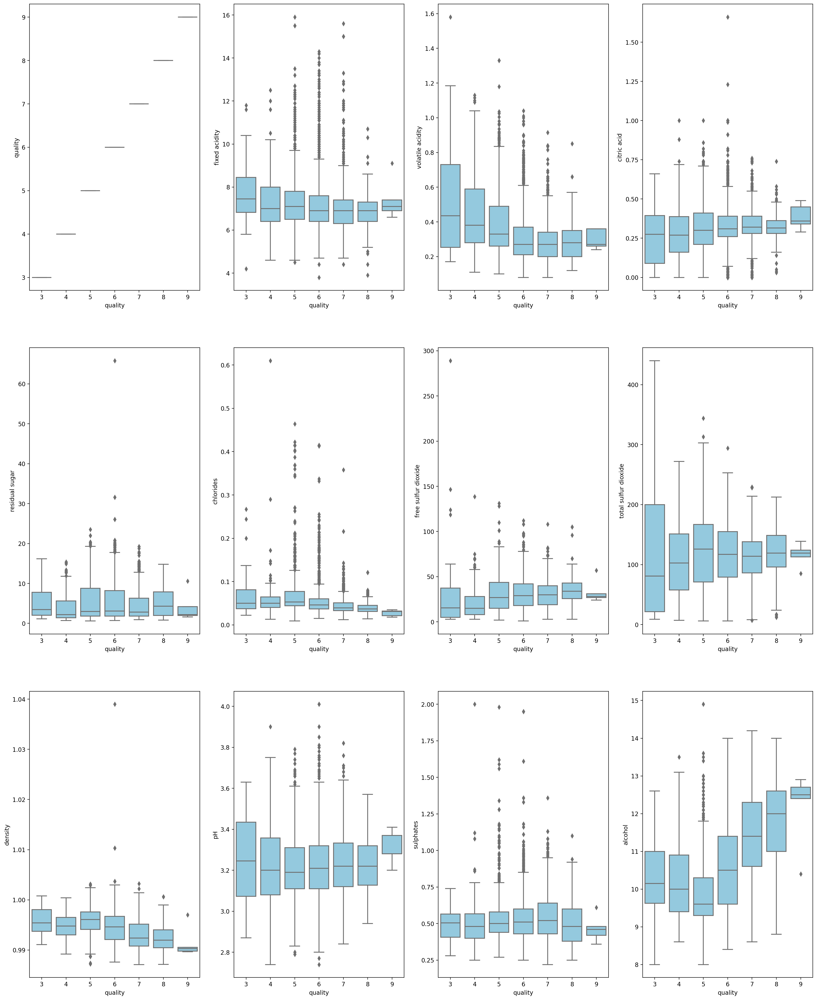

In [16]:
# boxplot을 통한 이상치 확인

wine1_num = wine1.drop(columns="type")


fig, ax1 = plt.subplots(3, 4, figsize=(24, 30))
columns = list(wine1_num.columns)

k = 0
for i in range(3):
    for j in range(4):
        sns.boxplot(x='quality', y=columns[k], data=wine1_num, ax=ax1[i][j], color='skyblue')
        k += 1
plt.show()


거의 모든 열에 많은 이상치가 있으니, 변환을 생각해봐야겠다

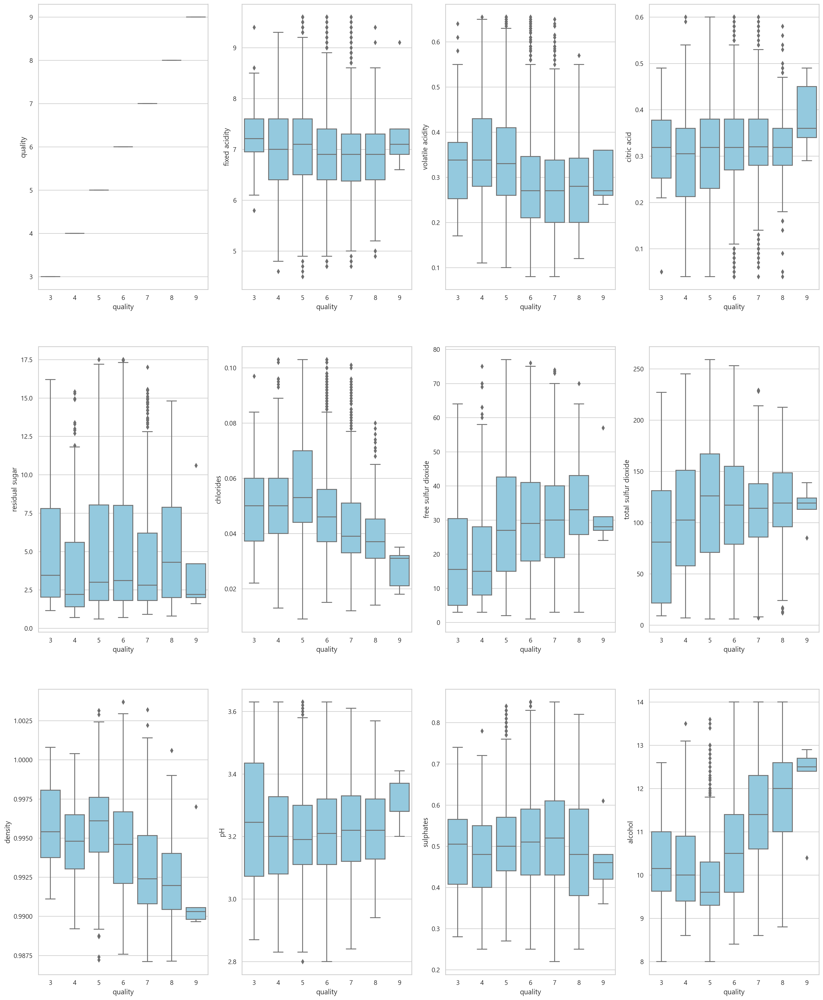

In [17]:
# 이상치 변환

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

wine1_imputation_mean=wine1.copy()


# 박스 플롯 함수 정의
def plot_boxplot(data, column, title):
    sns.boxplot(data[column])
    plt.title(title)
    plt.show()

# 대체할 열 목록
columns_to_impute = wine1_imputation_mean.columns.drop(['quality','type'])

# 평균 대체
for column in columns_to_impute:
    # plot_boxplot(df_imputation_mean, column, f"Box Plot before mean imputation: {column}")
    
    q1 = wine1_imputation_mean[column].quantile(0.25)
    q3 = wine1_imputation_mean[column].quantile(0.75)
    iqr = q3 - q1
    lower_tail = q1 - 1.5 * iqr
    upper_tail = q3 + 1.5 * iqr
    mean_value = wine1_imputation_mean[column].mean()
    
    wine1_imputation_mean[column] = np.where((wine1_imputation_mean[column] > upper_tail) | (wine1_imputation_mean[column] < lower_tail), mean_value, wine1_imputation_mean[column])
    
    # plot_boxplot(df_imputation_mean, column, f"Box Plot after mean imputation: {column}")

# boxplot
sns.set(style="whitegrid")
plt.rc('font', family='Malgun Gothic')
fig, ax1 = plt.subplots(3, 4, figsize=(24, 30))
columns = list(wine1_imputation_mean.columns)

k = 0
for i in range(3):
    for j in range(4):
        sns.boxplot(x='quality', y=columns[k], data=wine1_imputation_mean, ax=ax1[i][j], color='skyblue')
        k += 1
plt.show()

상관관계 핥아보기

c:\Users\zezeg\.conda\envs\datavisual\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\zezeg\.conda\envs\datavisual\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\zezeg\.conda\envs\datavisual\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\zezeg\.conda\envs\datavisual\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future

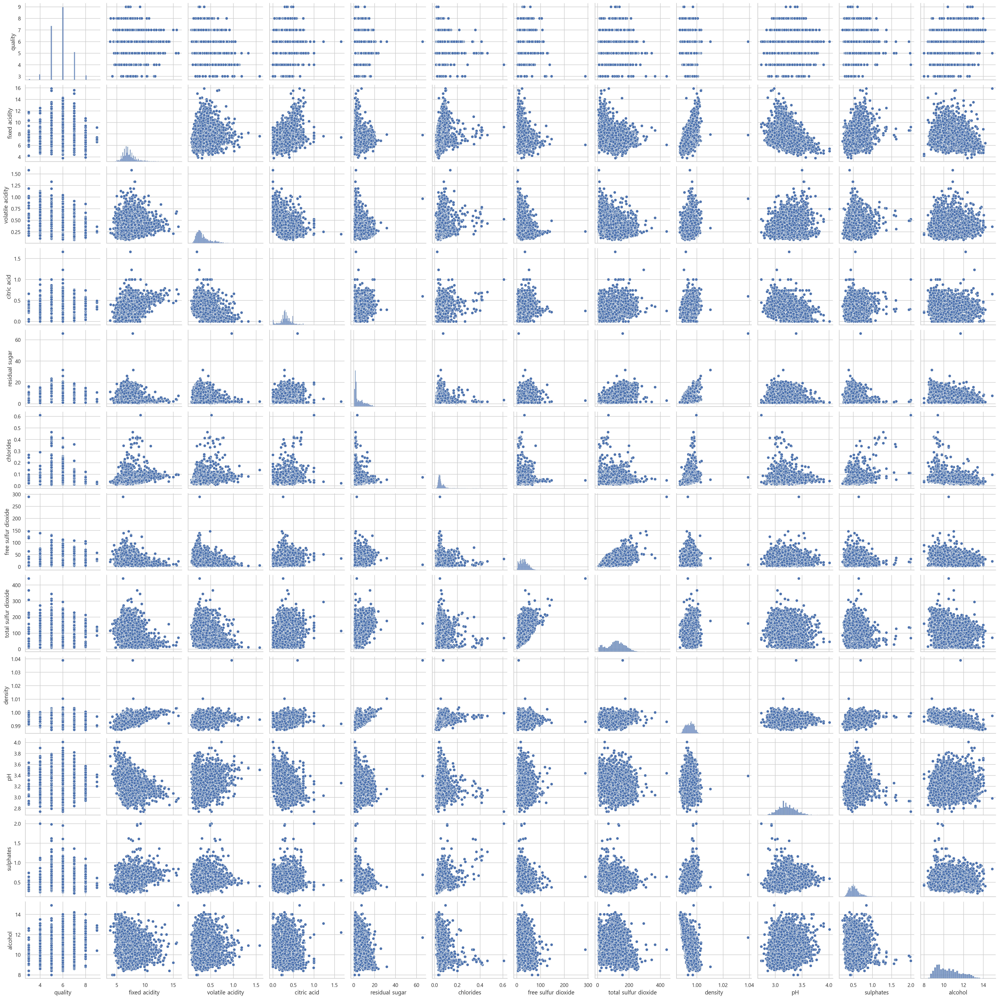

In [18]:
# 전체 pairplot
sns.pairplot(wine1.select_dtypes(include=['number']))

In [19]:
wine11 = wine1_imputation_mean.copy()
wine11_num = wine11.drop(columns="type")

c:\Users\zezeg\.conda\envs\datavisual\Lib\site-packages\seaborn\utils.py:80: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()


Text(0.5, 1.0, 'correlation heatmap')

c:\Users\zezeg\.conda\envs\datavisual\Lib\site-packages\IPython\core\events.py:82: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  func(*args, **kwargs)
c:\Users\zezeg\.conda\envs\datavisual\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


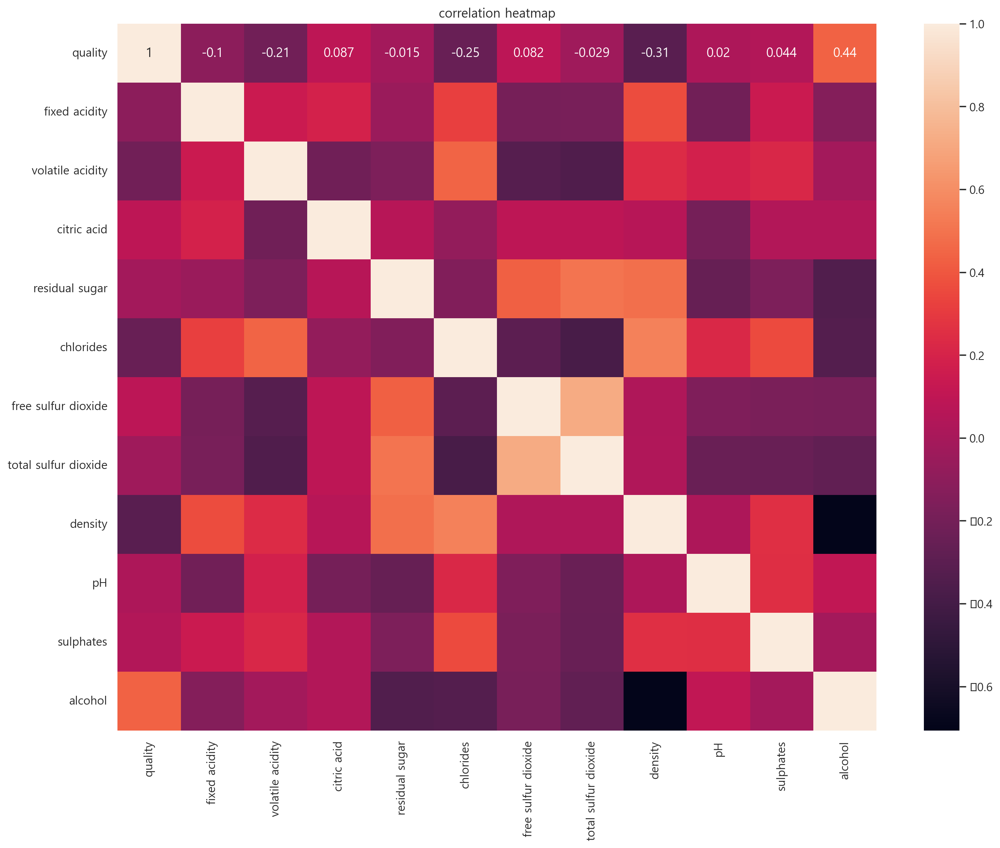

In [20]:
#변수별 상관관계 살펴보기 
plt.figure(figsize=(16,12))
sns.heatmap(wine11_num.corr(),annot=True)
plt.title('correlation heatmap') 

In [21]:
# quality에 관계있는 것만 확대하여 보자

corr_matrix = wine11.corr(numeric_only=True)
corr_matrix["quality"].sort_values(ascending=False)


quality                1.00
alcohol                0.44
citric acid            0.09
free sulfur dioxide    0.08
                       ... 
fixed acidity         -0.10
volatile acidity      -0.21
chlorides             -0.25
density               -0.31
Name: quality, Length: 12, dtype: float64

quality의 상관관계가 각각 알콜도수가 0.44, 밀도가 음의 상관관계 -0.32, 염화이온이 -0.2, 휘발성산이 -0.26이다.

높다고 보기는 힘들 듯함

## 상관관계를 통한 EDA

앞에서 연관이 컸던, 알콜도수, 밀도, 염화이온, 휘발성산 먼저 살펴보자

c:\Users\zezeg\.conda\envs\datavisual\Lib\site-packages\seaborn\_core\plot.py:1491: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context("mode.use_inf_as_na", True):
c:\Users\zezeg\.conda\envs\datavisual\Lib\site-packages\seaborn\_core\plot.py:1491: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context("mode.use_inf_as_na", True):
c:\Users\zezeg\.conda\envs\datavisual\Lib\site-packages\seaborn\_core\plot.py:1525: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  df_subset = grouped_df.get_group(pd_key)
c:\Users\zezeg\.conda\envs\datavisual\Lib\site-packages\seaborn\_core\plot.py:1525: FutureWarning: When grouping w

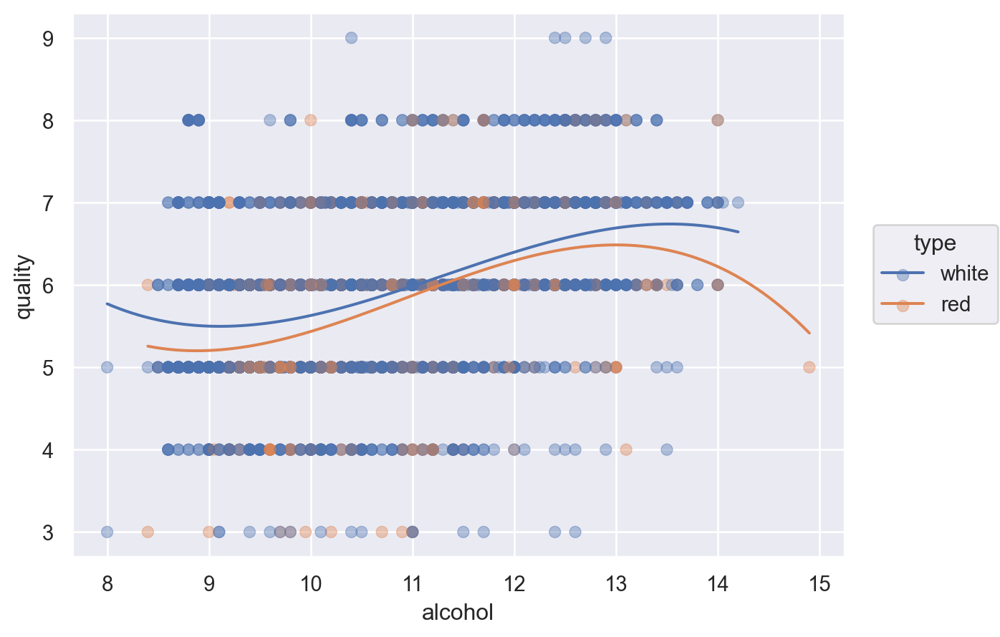

In [22]:
# 도수와 quality의 관계
(
    so.Plot(wine1,x="alcohol",y="quality",color="type")
    .add(so.Dot(alpha=.4))
    .add(so.Line(),so.PolyFit(3))
)

# QUALITY가 이산형이라 이 그래프를 깊게 파보는 것은 별로 유용하지 않아보임.

# 단, 도수가 높아질수록 퀄이 상승하는 경향을 읽을 수 있다.

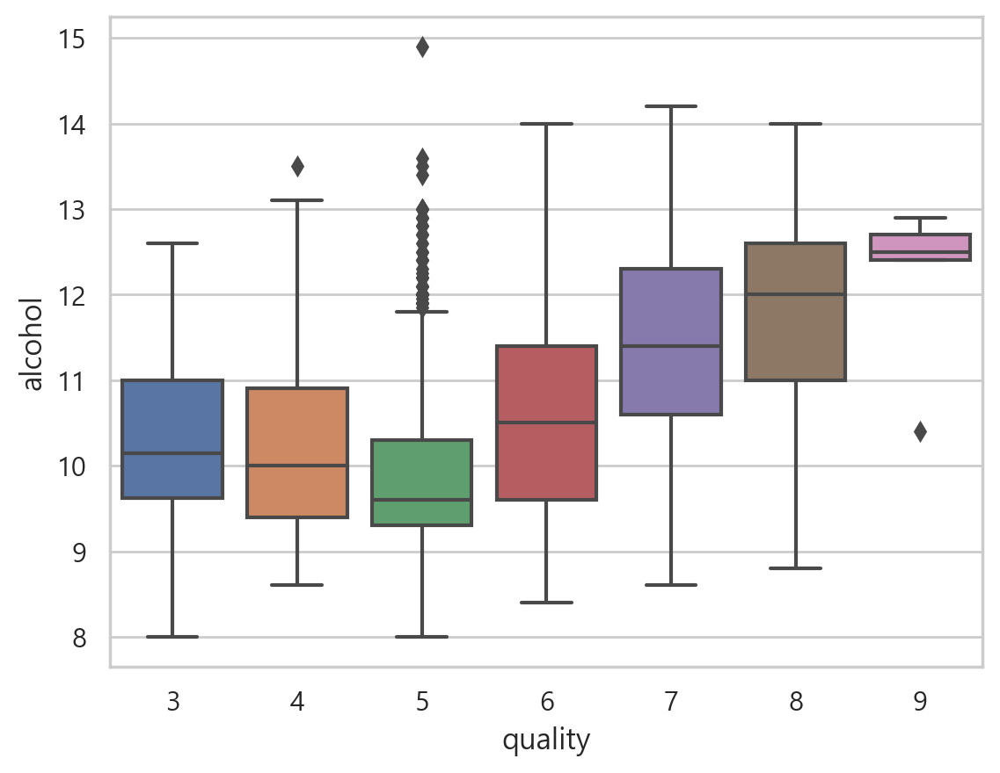

In [23]:
# quality가 이산형이므로 박스플롯이 나을듯 함.

sns.boxplot(data=wine1, x="quality", y="alcohol")
plt.show()


# 특정 퀄리티 이상에서는 확실히 QUALITY와 알코올 도수가 비례하는듯.
# QUALITY 5 와인의 알코올에 대한 분석 필요할듯(이상치로 찍히는 값이 매우 많음.)

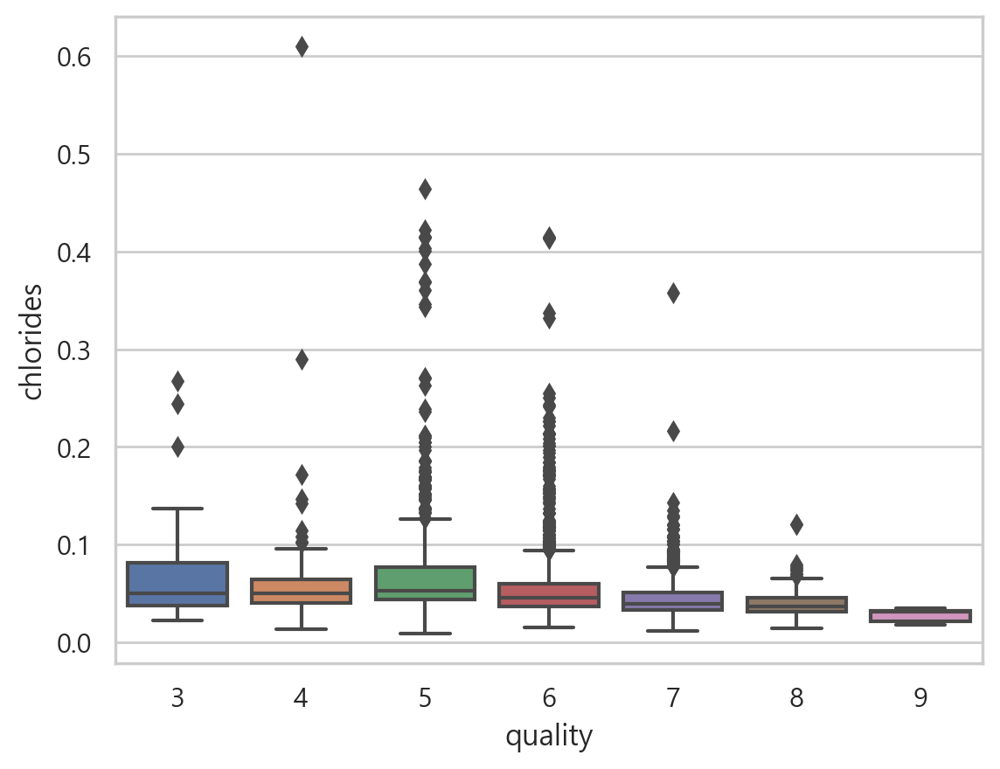

In [24]:
sns.boxplot(data=wine1, x="quality", y="chlorides")
plt.show()

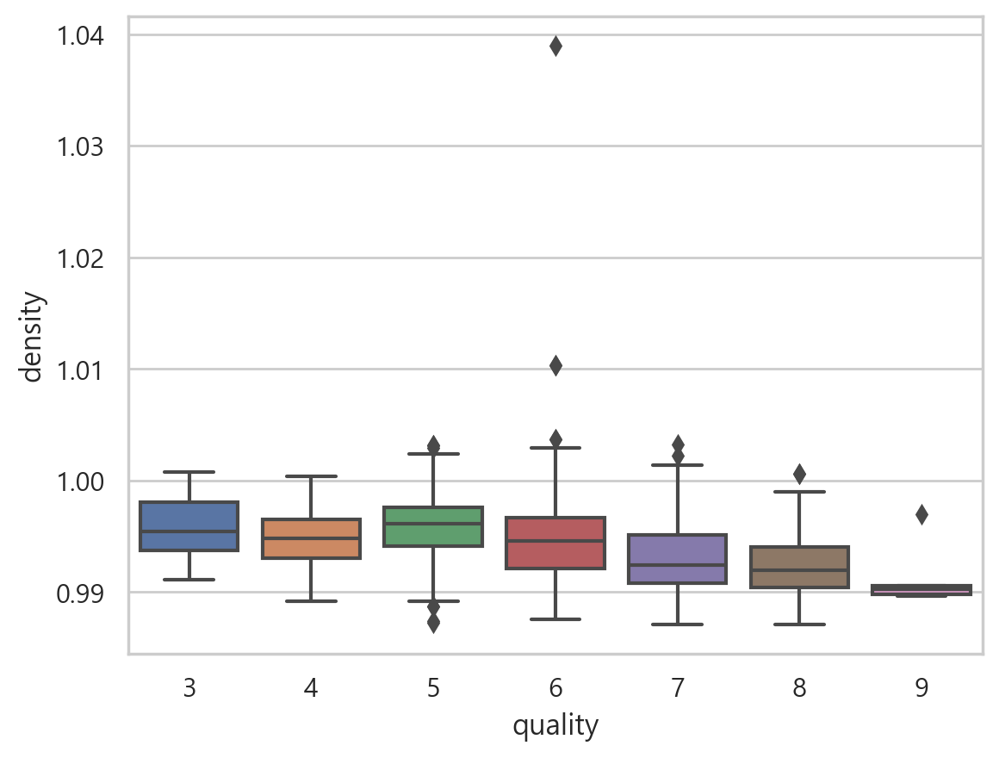

In [25]:
sns.boxplot(data=wine1, x="quality", y="density")
plt.show()

# 역시 QUALITY 5 이후로 퀄리티가 높아질수록 밀도 감소하는 경향을 보임

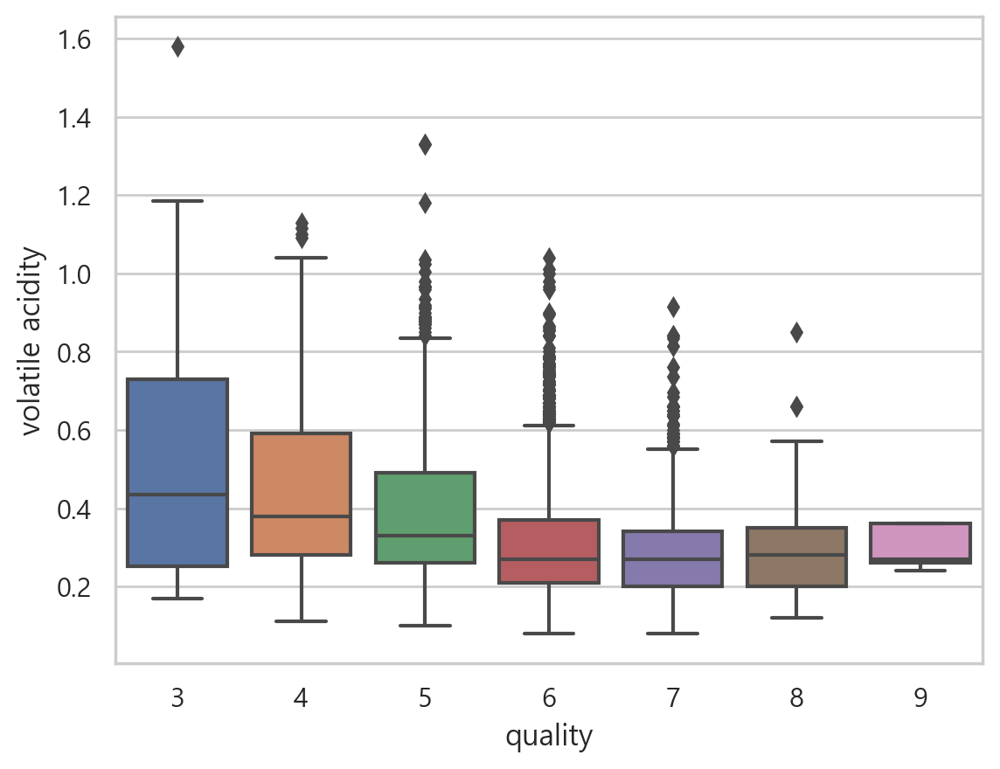

In [26]:
# 휘발성 산과 퀄리티

sns.boxplot(data=wine1, x="quality", y="volatile acidity")
plt.show()


# 앞쪽은 퀄이 높아질수록 낮아지는 경향을 보이나, 이상치로 분류되는 값이 많아 보임.

# "oo 경향이다" 라고 단정짓기 애매

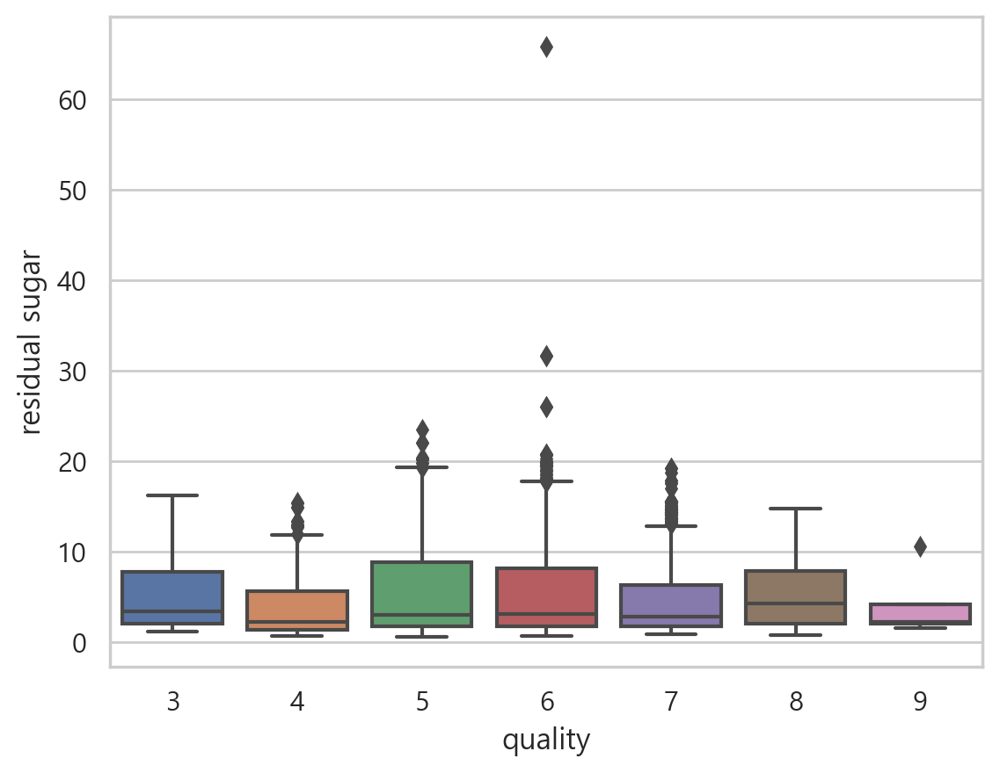

In [27]:
sns.boxplot(data=wine1, x="quality", y="residual sugar")
plt.show()

quality = 5 근처에서 경향성이 나뉘는 듯.

QUALITY 5부터 저급 와인과 고급 와인이 나누어지는지 확인해봐야겠다.



In [28]:
wine1_lowq = wine1[wine1["quality"]<5]

wine1_highq = wine1[wine1["quality"]>=5]

wine1_greatq = wine1[wine1["quality"]>=7]


corr_matrix = wine1_highq.corr(numeric_only=True)
corr_matrix["quality"].sort_values(ascending=False)

# 약간 오르긴 하였으나, 그리 큰 영향은 아닌듯?

quality             1.00
alcohol             0.47
citric acid         0.06
pH                  0.03
                    ... 
fixed acidity      -0.08
chlorides          -0.21
volatile acidity   -0.23
density            -0.33
Name: quality, Length: 12, dtype: float64

volcate acid에 대한 이상치들 확인 - q5, q6, q7일때

In [29]:
wine1_567 = wine1[(wine1["quality"]>=5)&(wine1["quality"]<=7)]

special = wine1_567[wine1_567["volatile acidity"]>=0.6]

sp1 = special["type"].value_counts().reset_index()
sp1 # type 차이일까?


,type,count
0,red,426
1,white,37


In [30]:
sp2 = wine1_567["type"].value_counts().reset_index()
sp2

,type,count
0,white,3853
1,red,1275


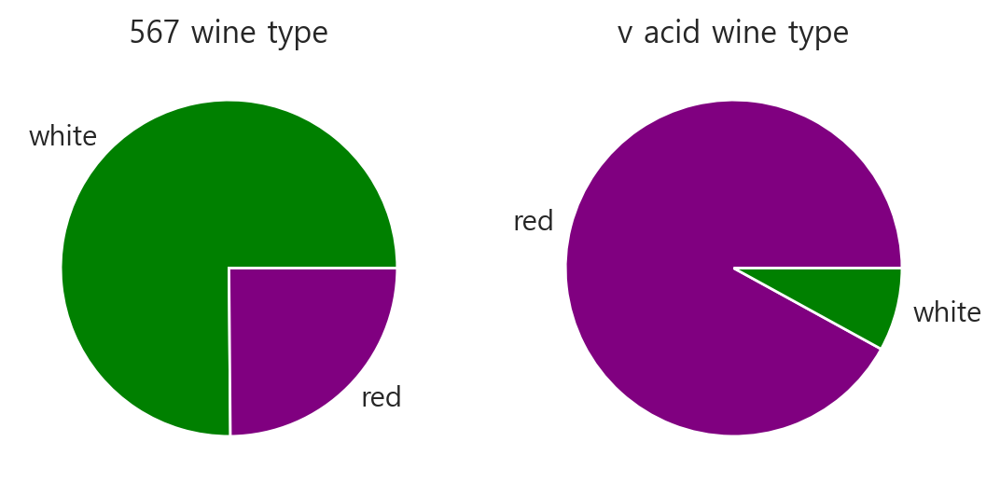

In [31]:
plt.subplot(1, 2, 1)
plt.pie(sp2["count"], labels=sp2["type"],colors=["green","purple"])
plt.title("567 wine type")

# 두 번째 파이 차트
plt.subplot(1, 2, 2)
plt.pie(sp1["count"], labels=sp1["type"],colors=["purple","green"])
plt.title("v acid wine type")


# 그래프 보여주기
plt.show()

# 중간 퀄의 레드와인일때 특이하게 산도가 높은듯.
# 즉 volatile acidity가 매우 높으면 레드와인으로 분류한다면 정확도가 높을 것 같다. 


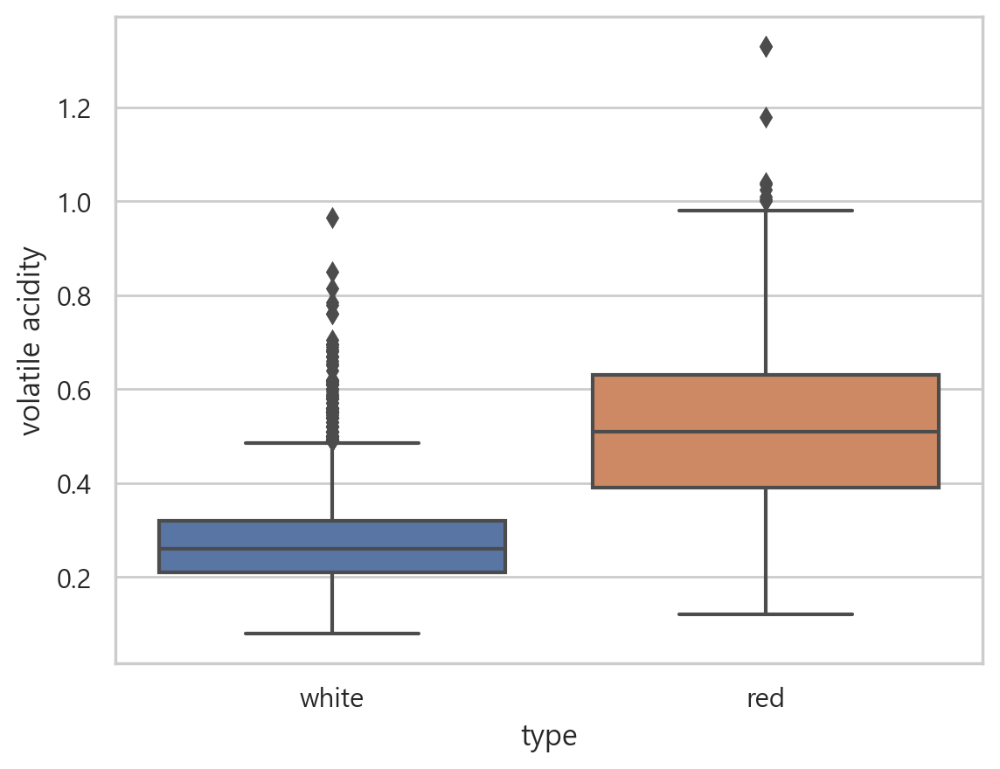

In [32]:

sns.boxplot(data=wine1_567, x="type", y="volatile acidity")
plt.show()

#이 부근에서 red와인이 산도가 높은 것은 맞지만, white와인의 이상치 개수가 눈에 띈다. 
 
# 이것이 special에서 화이트에 해당하는 것이다.

# 일단 v acidity가 white와 red를 나눌 수 있는 유의미한 피쳐라는 건 확인

In [33]:
red567 = wine1_567[wine1_567["type"] == "red"]
white567 = wine1_567[wine1_567["type"] == "white"]


#산도가 이상치로 찍힐 정도로 높았던 화이트를 추출
white567_acid = white567[white567["volatile acidity"]>=0.5]
white567_acid 

,quality,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,type
0,5,5.60,0.69,0.06,6.80,0.04,9.00,84.00,0.99,3.44,0.44,10.20,white
84,5,5.70,0.69,0.06,6.80,0.04,9.00,84.00,0.99,3.44,0.44,10.20,white
169,5,6.40,0.62,0.12,4.70,0.06,33.00,196.00,1.00,3.22,0.48,8.90,white
196,6,4.70,0.79,0.00,3.40,0.04,23.00,134.00,0.99,3.53,0.92,13.80,white
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5134,6,5.50,0.62,0.33,1.70,0.04,24.00,118.00,0.99,3.15,0.39,13.55,white
5164,6,6.90,0.52,0.54,7.90,0.04,23.00,169.00,0.99,3.26,0.47,12.20,white
5220,5,7.10,0.85,0.49,8.70,0.03,40.00,184.00,1.00,3.22,0.36,10.70,white
5377,5,6.70,0.54,0.28,5.40,0.06,21.00,105.00,0.99,3.27,0.37,9.00,white


In [34]:
white567_acid.describe()

,quality,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
count,98.00,98.00,98.00,98.00,98.00,98.00,98.00,98.00,98.00,98.00,98.00,98.00
mean,5.52,6.63,0.59,0.24,6.78,0.05,30.35,141.86,0.99,3.22,0.48,10.50
std,0.65,0.87,0.09,0.17,7.44,0.02,15.54,47.83,0.01,0.12,0.13,1.55
min,5.00,4.40,0.50,0.00,0.80,0.01,3.00,9.00,0.99,2.96,0.29,8.70
25%,5.00,6.10,0.53,0.10,2.40,0.04,19.00,108.00,0.99,3.15,0.39,9.30
50%,5.00,6.60,0.56,0.24,5.05,0.04,28.00,132.00,0.99,3.22,0.46,9.70
75%,6.00,7.20,0.62,0.34,9.97,0.05,38.75,172.75,1.00,3.28,0.54,11.88
max,7.00,8.50,0.96,0.74,65.80,0.21,81.00,252.00,1.04,3.56,0.94,14.05


In [35]:
corr_matrix = white567_acid.corr(numeric_only=True)
corr_matrix["quality"].sort_values(ascending=False)

# volatile산도가 특히 높은 화이트와인의 상관계수인데... 더 파고 들어야될까?

quality                 1.00
alcohol                 0.54
sulphates               0.40
residual sugar          0.13
                        ... 
total sulfur dioxide   -0.08
density                -0.09
fixed acidity          -0.17
chlorides              -0.22
Name: quality, Length: 12, dtype: float64

위에서 보았을 때, red와 white는 따로 나누어져서 봐야할 것으로 보임.

즉 일부 퀄리티에서는 red의 특성과 white의 특성이 서로 다를 수도 있음.

대다수를 차지하는 중간 계층(q5, q6, q7)에서의 레드 화이트 차이를 더 알아보자.

이 근방에서만 잘 분류해도 정확도가 높아질 것임.

In [36]:
# 각각 퀄이 5,6,7인 레드와 화이트

red567 = wine1_567[wine1_567["type"] == "red"]
white567 = wine1_567[wine1_567["type"] == "white"] # 위에서 정의한 것 다시 가져옴



In [37]:
corr_matrix = red567.corr(numeric_only=True)
corr_matrix["quality"].sort_values(ascending=False)

quality                 1.00
alcohol                 0.50
sulphates               0.25
citric acid             0.19
                        ... 
chlorides              -0.12
density                -0.19
total sulfur dioxide   -0.28
volatile acidity       -0.33
Name: quality, Length: 12, dtype: float64

앞과 비교하였을 때, 나누어서 살펴보니

redwine의 quality를 구별해주는 유의미한 feature가 늘었음. 알코올 0.5, sulphates 0.25, total sulfur dioxide -0.33.... 등등

특히, red와 white는 red가 v_ acidity가 white에 비해 높은 편이기 때문에 서로 분포가 다르고,

red와 가장 큰 음의 상관관계를 지님.

 구별에 유의미할듯?

In [38]:
corr_matrix = white567.corr(numeric_only=True)
corr_matrix["quality"].sort_values(ascending=False)

# white wine 역시 sulfur dioxide가 개선됨.
# density가 음의 상관관계

quality                 1.00
alcohol                 0.45
pH                      0.10
sulphates               0.07
                        ... 
volatile acidity       -0.16
chlorides              -0.21
total sulfur dioxide   -0.22
density                -0.32
Name: quality, Length: 12, dtype: float64

In [39]:
# 비교용으로 전체 상관관계 걸 다시 출력


corr_matrix = wine1.corr(numeric_only=True)
corr_matrix["quality"].sort_values(ascending=False)

quality                1.00
alcohol                0.44
citric acid            0.08
free sulfur dioxide    0.06
                       ... 
fixed acidity         -0.08
chlorides             -0.20
volatile acidity      -0.26
density               -0.30
Name: quality, Length: 12, dtype: float64

따라서 먼저 레드와 화이트를 나눈 다음, 이후 분류하면 유용할듯 함.

In [40]:
# 한편, 상대적으로 low quality와 great quality(8,9)는 무엇과 연관성이 클까

# 앞에서 우리는 이렇게 정의했다.


wine1_lowq = wine1[wine1["quality"]<5]

wine1_highq = wine1[wine1["quality"]>=5]

wine1_greatq = wine1[wine1["quality"]>7]

In [41]:
# lowq일때 
corr_matrix = wine1_lowq[wine1_lowq["type"]=="red"].corr(numeric_only=True)
corr_matrix["quality"].sort_values(ascending=False)

# v acidity가 음의 상관계수가 높게나옴

quality                 1.00
total sulfur dioxide    0.23
free sulfur dioxide     0.21
alcohol                 0.13
                        ... 
fixed acidity          -0.08
chlorides              -0.13
density                -0.21
volatile acidity       -0.37
Name: quality, Length: 12, dtype: float64

In [42]:
# lowq white
corr_matrix = wine1_lowq[wine1_lowq["type"]=="white"].corr(numeric_only=True)
corr_matrix["quality"].sort_values(ascending=False)

# total dioxide와 sulfur dioxide와 음의상관계수 절댓값 상승

quality                 1.00
volatile acidity        0.10
pH                      0.02
sulphates              -0.03
                        ... 
fixed acidity          -0.14
residual sugar         -0.14
total sulfur dioxide   -0.24
free sulfur dioxide    -0.33
Name: quality, Length: 12, dtype: float64

화이트와인이 lowq일때는 quality와 

total sulfur dio, free sulfur dio와 음의 상관관계,

양의 상관관계인 레드와 가장 큰 차이점이다.

또한 volatile acidity가 레드와인 퀄리티와의 상관관계에서 -0.4로 높아짐


In [43]:
wine1_lowq["type"].value_counts()

type
white    162
red       50
Name: count, dtype: int64

In [44]:
wine1_greatq["type"].value_counts()

# 앞의 그래프에서도 본적 있지만, greatq는 white의 비율이 더 높음.

type
white    144
red       13
Name: count, dtype: int64

In [45]:
# greatq일 때 - 다른 분류점이 있을지 봐야할듯. 너무 상관관계가 작음

corr_matrix = wine1_greatq[wine1_greatq["type"]=="white"].corr(numeric_only=True)
corr_matrix["quality"].sort_values(ascending=False)

quality                 1.00
fixed acidity           0.16
pH                      0.12
citric acid             0.12
                        ... 
density                -0.06
total sulfur dioxide   -0.06
residual sugar         -0.08
chlorides              -0.15
Name: quality, Length: 12, dtype: float64

In [46]:
corr_matrix = wine1_greatq[wine1_greatq["type"]=="red"].corr(numeric_only=True)
corr_matrix["quality"].sort_values(ascending=False)

quality            NaN
fixed acidity      NaN
volatile acidity   NaN
citric acid        NaN
                    ..
density            NaN
pH                 NaN
sulphates          NaN
alcohol            NaN
Name: quality, Length: 12, dtype: float64

아직은 각 피쳐와 상관관계를 어떻게 이용할지 모르겠음. 추후 튜닝에 사용해보겠다.

## 분석 준비 - train & test

In [47]:
wine11 = wine1_imputation_mean.copy()

In [48]:
wine11.head(5)

,quality,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,type
0,5,5.60,0.34,0.06,6.80,0.04,9.00,84.00,0.99,3.44,0.44,10.20,white
1,5,8.80,0.61,0.14,2.40,0.07,10.00,42.00,1.00,3.19,0.59,9.50,red
2,5,7.90,0.21,0.39,2.00,0.06,21.00,138.00,0.99,3.05,0.52,10.90,white
3,6,7.00,0.21,0.31,6.00,0.05,29.00,108.00,0.99,3.26,0.50,10.80,white
4,6,7.80,0.40,0.26,9.50,0.06,32.00,178.00,1.00,3.04,0.43,10.90,white


In [49]:
from sklearn.model_selection import train_test_split
strat_train_set, strat_test_set = train_test_split(wine11, test_size = 0.2, random_state=42, stratify = wine11["quality"])

In [50]:
# 잘 추출되었는지 확인

# 본 데이터셋
wine1["quality"].value_counts() / len(wine1)

quality
6   0.44
5   0.33
7   0.17
4   0.03
8   0.03
3   0.00
9   0.00
Name: count, dtype: float64

In [51]:
# 우리 test set

strat_test_set["quality"].value_counts() / len(strat_test_set)

quality
6   0.44
5   0.33
7   0.17
4   0.03
8   0.03
3   0.00
9   0.00
Name: count, dtype: float64

In [52]:
wine1["quality"].value_counts()

quality
6    2416
5    1788
7     924
4     186
8     152
3      26
9       5
Name: count, dtype: int64

In [53]:
strat_test_set["quality"].value_counts()

quality
6    484
5    358
7    185
4     37
8     30
3      5
9      1
Name: count, dtype: int64

567이 다른 클래스에 비해 훈련 데이터에 너무 과도하게 들어있어, 잘 훈련될까 의문이 듦. 특히 3과 9는 학습 데이터 자체도 너무 적다고 판단된다.

아래서 더 개선해보자.

In [54]:
# train set wine2

wine2 = strat_train_set.drop("quality", axis = 1)
wine2_labels = strat_train_set["quality"].copy()



# test set test2
test2 = strat_test_set.drop("quality", axis = 1)
test2_labels = strat_test_set["quality"].copy()

## 전처리 파이프라인 구축

In [55]:
from sklearn.pipeline import Pipeline
from sklearn.pipeline import make_pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import FunctionTransformer
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import PowerTransformer # for boxcox
from scipy.stats import boxcox



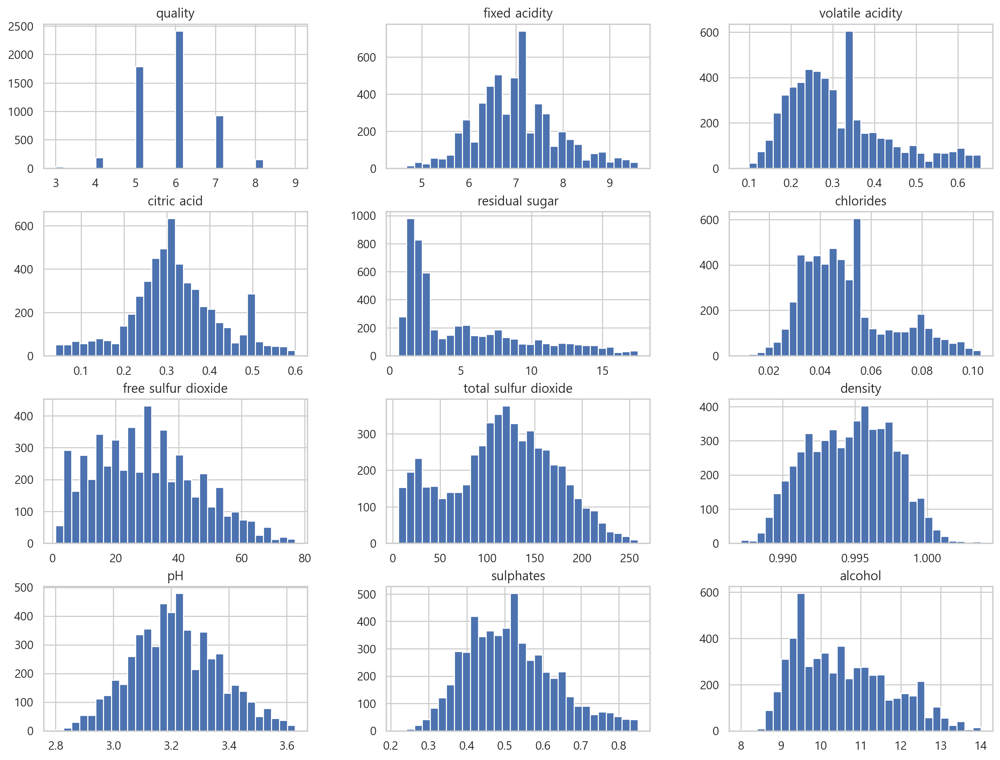

In [56]:
wine11_num.hist(bins=30, figsize=(16,12))
plt.show()

C:\Users\zezeg\AppData\Local\Temp\ipykernel_40288\80385252.py:2: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  wine2_log = wine2.drop(columns="type").applymap(lambda x: np.log(x + 1e-7))
c:\Users\zezeg\.conda\envs\datavisual\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


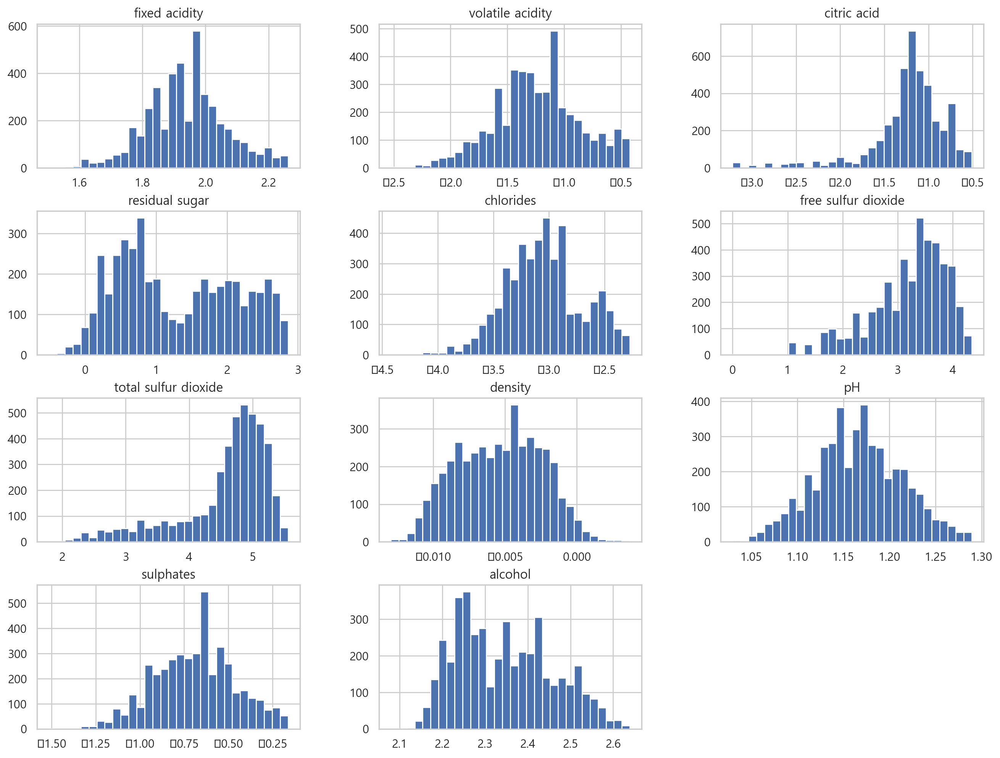

In [57]:

#로그를 통한 변환 성능 파악
wine2_log = wine2.drop(columns="type").applymap(lambda x: np.log(x + 1e-7))

wine2_log.hist(bins=30, figsize=(16,12))
plt.show()

로그만 취해서는 정규화되었다고 보기 어려움.

정규화 - boxcox 성능 파악

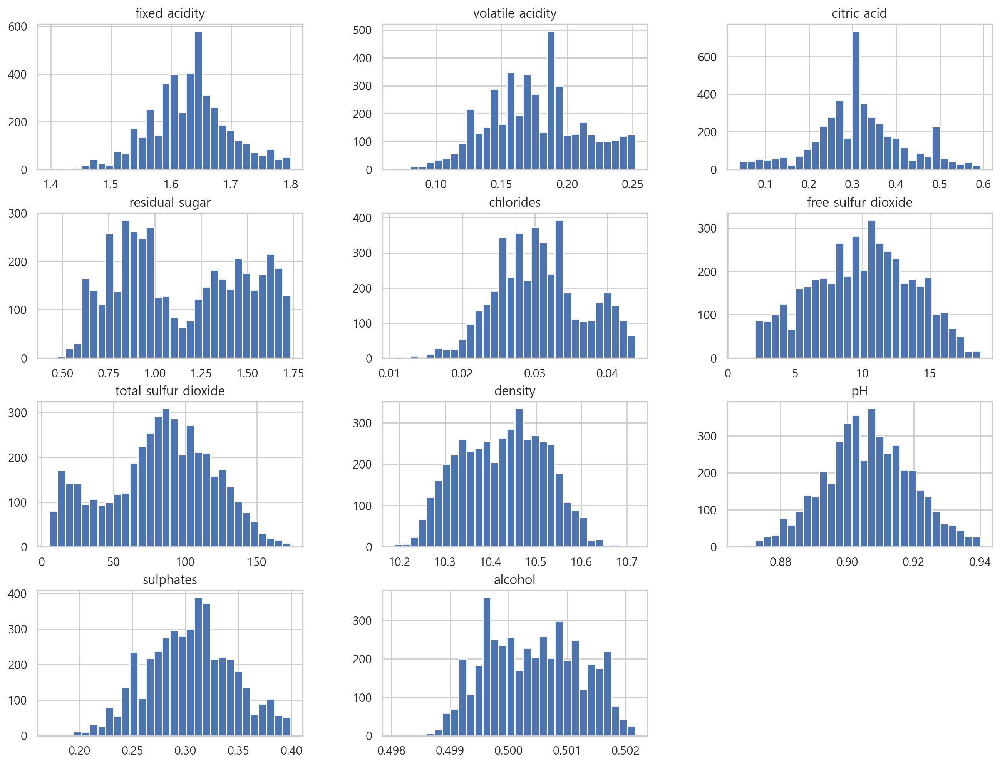

In [58]:
# boxcox는 열별로 적용해줘야함

wine2_num = wine2.drop(columns="type")

column = wine2_num.columns


X_boxcox_scaled = pd.DataFrame()
for col in column:
    X_boxcox_scaled[col], _ = boxcox(wine2_num[col] + 1)

X_boxcox_scaled.hist(bins=30, figsize=(16,12))
plt.show()

citric acid, pH, sulphates, fixed 에 대해 성능이 좋고

total sulfur dioxide , residual sugar는 박스콕스 변환해도 정규화되었다고 보기 어려움

In [59]:
wine2.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'type'],
      dtype='object')

In [60]:
# 변환 파이프라인


# 범주형 피쳐 리스트
cat_at = ["type"]

# 로그 변환할 피쳐 리스트
log_at=["fixed acidity", "volatile acidity", "density", "sulphates", "pH"]

#박스콕스 변환 리스트
boxcox_at = ["citric acid", "alcohol", "chlorides", "free sulfur dioxide", "total sulfur dioxide","residual sugar"]


# 범주형 피쳐를 위한 파이프라인 - onehot encode
cat_pipeline = Pipeline([
    ("impute", SimpleImputer(strategy="most_frequent")),
    ("encode", OneHotEncoder(handle_unknown="ignore"))
])



# 박스콕스 변환 파이프라인
boxcox_pipeline = Pipeline([
    ("impute", SimpleImputer(strategy="median")),
    ("boxcox", PowerTransformer(method="box-cox")),  # 로그 변환 (np.log1p은 log(1 + x)를 계산)
    ("standardize", StandardScaler())])




# 로그 변환 파이프라인
log_pipeline = Pipeline([
    ("impute", SimpleImputer(strategy="median")),
    ("log_transform", FunctionTransformer(np.log1p, validate=True)),  # 로그 변환 (np.log1p은 log(1 + x)를 계산)
    ("standardize", MinMaxScaler())
])





# 전체 전처리 파이프라인 정의
preprocessing = ColumnTransformer(
    transformers=[
        ("cat", cat_pipeline, cat_at),
        ("boxcox", boxcox_pipeline, boxcox_at),  # 범주형 피쳐 파이프라인 적용
        ("log", log_pipeline, log_at)
    ]
)

# 데이터 전처리
wine_prepared = preprocessing.fit_transform(wine2)
feature_names=  ["type_red", "type_white", "citric acid", "alcohol", "chlorides", "free sulfur dioxide", "total sulfur dioxide","residual sugar", "fixed acidity", "volatile acidity", "density", "sulphates", "pH" ]



wine_prepared = pd.DataFrame(data = wine_prepared, columns = feature_names)
wine_prepared = wine_prepared.drop(columns="type_white")
# 변환된 데이터 확인
print(wine_prepared)


      type_red  citric acid  alcohol  chlorides  free sulfur dioxide  \
0         0.00         2.49    -2.00      -0.58                 0.74   
1         0.00        -0.26     1.67      -1.86                 0.42   
2         0.00         0.59     1.46      -1.44                 0.19   
3         0.00        -0.16    -1.07      -0.17                -0.12   
...        ...          ...      ...        ...                  ...   
4393      0.00        -0.35     0.15      -0.51                -0.24   
4394      0.00        -0.54    -1.19       0.30                 0.25   
4395      0.00         0.01     0.07      -0.11                -0.38   
4396      1.00        -0.45    -0.51       1.50                -1.22   

      total sulfur dioxide  residual sugar  fixed acidity  volatile acidity  \
0                     0.64            1.29           0.70              0.51   
1                     0.17            0.89           0.57              0.47   
2                     0.31           -1.42

In [61]:
test_prepared = preprocessing.fit_transform(test2)


feature_names= ["type_red", "type_white", "citric acid", "alcohol", "chlorides", "free sulfur dioxide", "total sulfur dioxide","residual sugar", "fixed acidity", "volatile acidity", "density", "sulphates", "pH" ]


test_prepared = pd.DataFrame(data = test_prepared, columns = feature_names)
test_prepared = test_prepared.drop(columns="type_white")


In [62]:
wine_prepared

,type_red,citric acid,alcohol,chlorides,free sulfur dioxide,total sulfur dioxide,residual sugar,fixed acidity,volatile acidity,density,sulphates,pH
0,0.00,2.49,-2.00,-0.58,0.74,0.64,1.29,0.70,0.51,0.65,0.48,0.34
1,0.00,-0.26,1.67,-1.86,0.42,0.17,0.89,0.57,0.47,0.27,0.73,0.45
2,0.00,0.59,1.46,-1.44,0.19,0.31,-1.42,0.23,0.42,0.11,0.26,0.60
3,0.00,-0.16,-1.07,-0.17,-0.12,-0.16,0.51,0.30,0.13,0.46,0.41,0.65
...,...,...,...,...,...,...,...,...,...,...,...,...
4393,0.00,-0.35,0.15,-0.51,-0.24,0.19,-0.59,0.41,0.29,0.28,0.46,0.49
4394,0.00,-0.54,-1.19,0.30,0.25,1.14,0.98,0.55,0.47,0.57,0.51,0.57
4395,0.00,0.01,0.07,-0.11,-0.38,0.28,-1.01,0.94,0.15,0.46,0.41,0.28
4396,1.00,-0.45,-0.51,1.50,-1.22,-0.93,-0.71,0.75,0.50,0.57,0.46,0.61


In [63]:
wine_prepared.shape

(4397, 12)

In [64]:
test_prepared

,type_red,citric acid,alcohol,chlorides,free sulfur dioxide,total sulfur dioxide,residual sugar,fixed acidity,volatile acidity,density,sulphates,pH
0,0.00,-1.29,-1.47,0.21,1.06,1.43,1.51,0.60,0.30,0.70,0.52,0.38
1,0.00,0.05,-0.85,-0.15,0.23,0.59,1.40,0.50,0.32,0.68,0.29,0.68
2,0.00,-1.00,-1.47,-0.27,0.67,-0.01,1.69,0.28,0.28,0.69,0.43,0.54
3,0.00,-0.72,1.35,-1.46,1.38,0.30,0.41,0.46,0.39,0.22,0.36,0.45
...,...,...,...,...,...,...,...,...,...,...,...,...
1096,0.00,0.72,0.85,-1.09,1.60,0.64,-0.98,0.42,0.16,0.26,0.52,0.78
1097,0.00,0.72,-0.32,-0.77,2.16,1.16,-1.83,0.76,0.22,0.33,0.18,0.31
1098,0.00,1.60,0.70,0.37,-0.61,0.67,-1.40,0.64,0.16,0.28,0.41,0.52
1099,0.00,0.34,1.63,0.15,-0.07,0.26,-0.33,0.65,0.48,0.23,0.52,0.63


최종비교 - no scaling / no nomalization

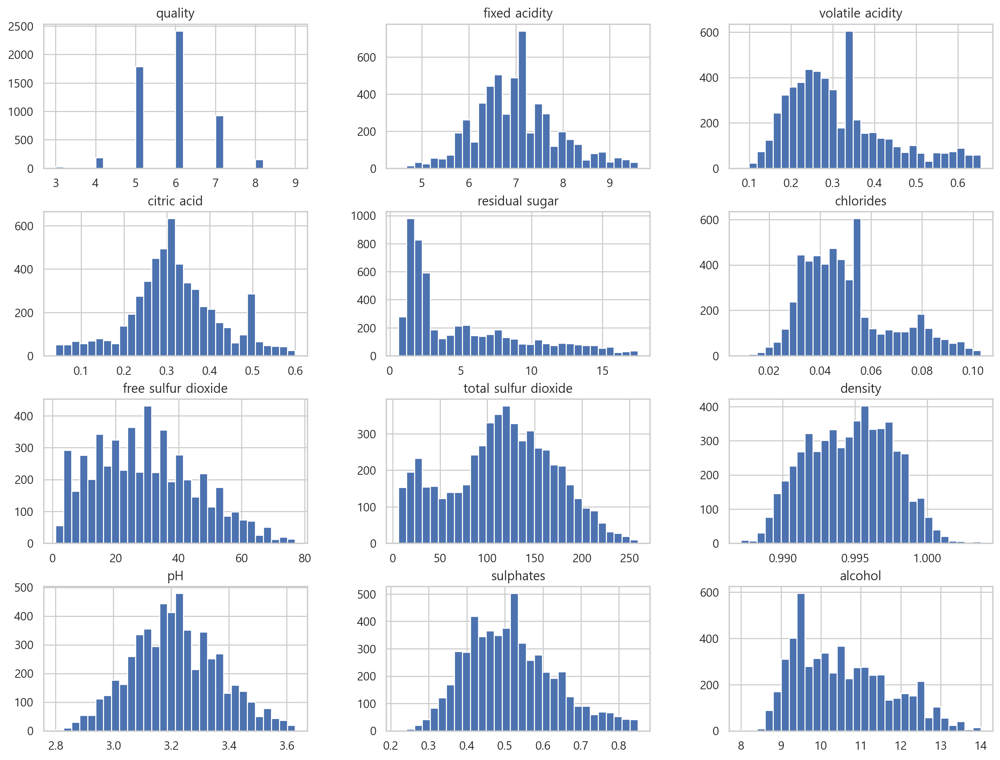

In [65]:
wine11.hist(bins=30, figsize=(16,12))
plt.show()

# 멀티모달 처리 - rbf kernel - pH, ALCOHOL
# 꼬리두꺼운친구 - 


c:\Users\zezeg\.conda\envs\datavisual\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


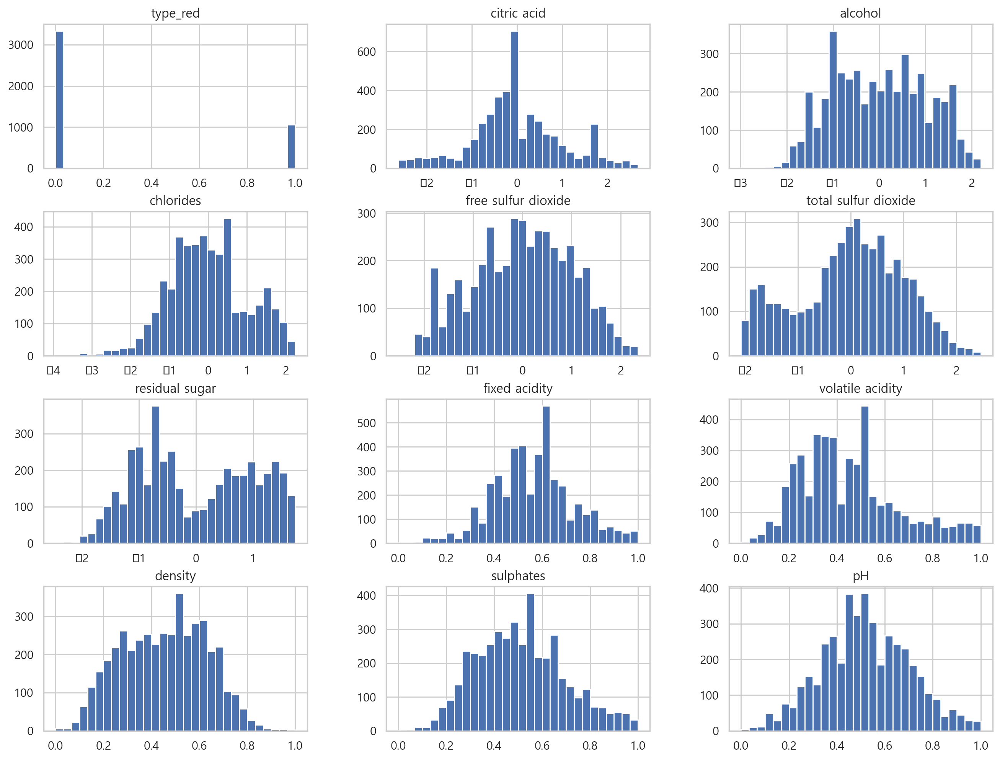

In [66]:
wine_prepared.hist(bins=30, figsize=(16,12))
plt.show()


c:\Users\zezeg\.conda\envs\datavisual\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\zezeg\.conda\envs\datavisual\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\zezeg\.conda\envs\datavisual\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\zezeg\.conda\envs\datavisual\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future

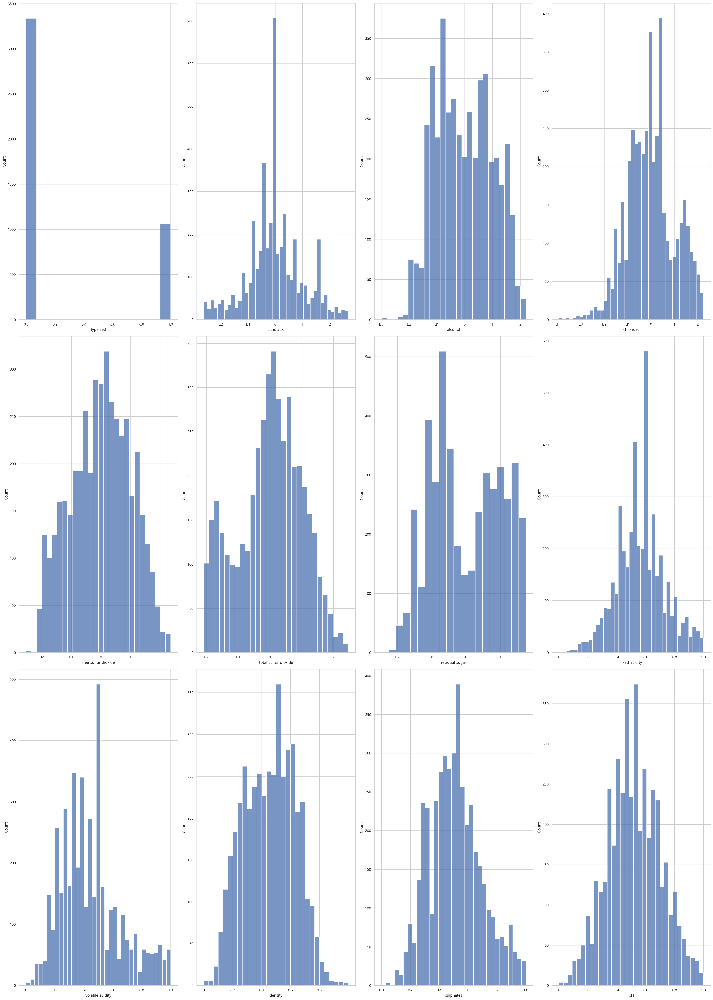

In [67]:
# histplot을 통해 그려보자


fig, ax1 = plt.subplots(3, 4, figsize=(30, 42))

column = wine_prepared.columns

k=0
for i in range(3):
    for j in range(4):
        if k < len(column):
            sns.histplot(wine_prepared[column[k]], ax=ax1[i][j])
            k=k+1
plt.tight_layout()
plt.show()


oversampling / undersampling

## 모델 돌리기

### decision tree 

 유의미한 피쳐 개수, max depth 등을 정하여 튜닝할 수 있기에 먼저 선택해 봄.

#### no regularization

In [68]:
from sklearn.tree import DecisionTreeClassifier

tree_clf = DecisionTreeClassifier(random_state= 42)
tree_clf.fit(wine_prepared, wine2_labels)

DecisionTreeClassifier(random_state=42)

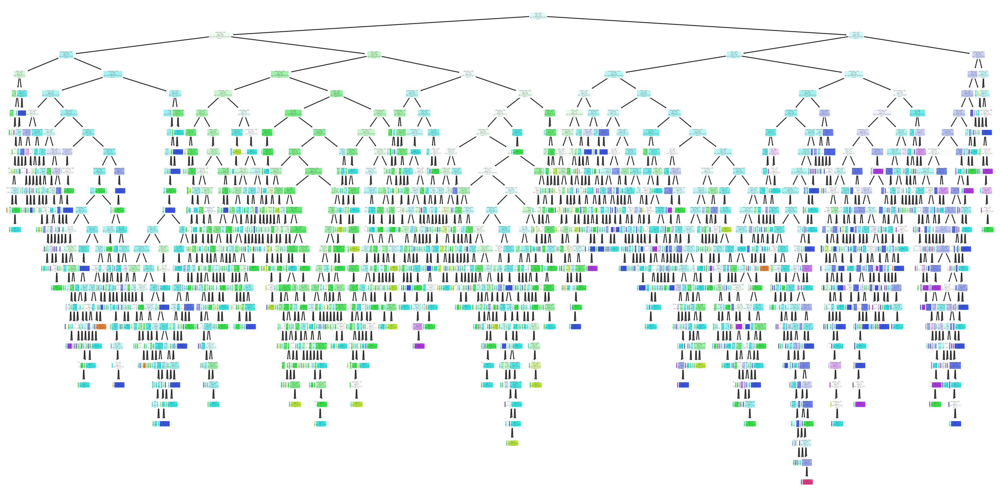

In [69]:
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

plt.figure(figsize = (20,10))

plot_tree(
        tree_clf,
        feature_names= ["type_red", "citric acid", "alcohol", "chlorides", "free sulfur dioxide", "total sulfur dioxide","residual sugar", "fixed acidity", "volatile acidity", "density", "sulphates", "pH" ],
        class_names = ["3","4","5","6","7","8","9"],
        rounded=True,
        filled=True
    )

plt.show()

In [70]:
accuracy = tree_clf.score(wine_prepared, wine2_labels)
print(f"Accuracy: {accuracy:.2f}")

Accuracy: 1.00


In [71]:
from sklearn.model_selection import cross_val_score
cross_val_score(tree_clf, wine_prepared, wine2_labels, cv=3, scoring="accuracy").round(3)

array([0.536, 0.536, 0.536])

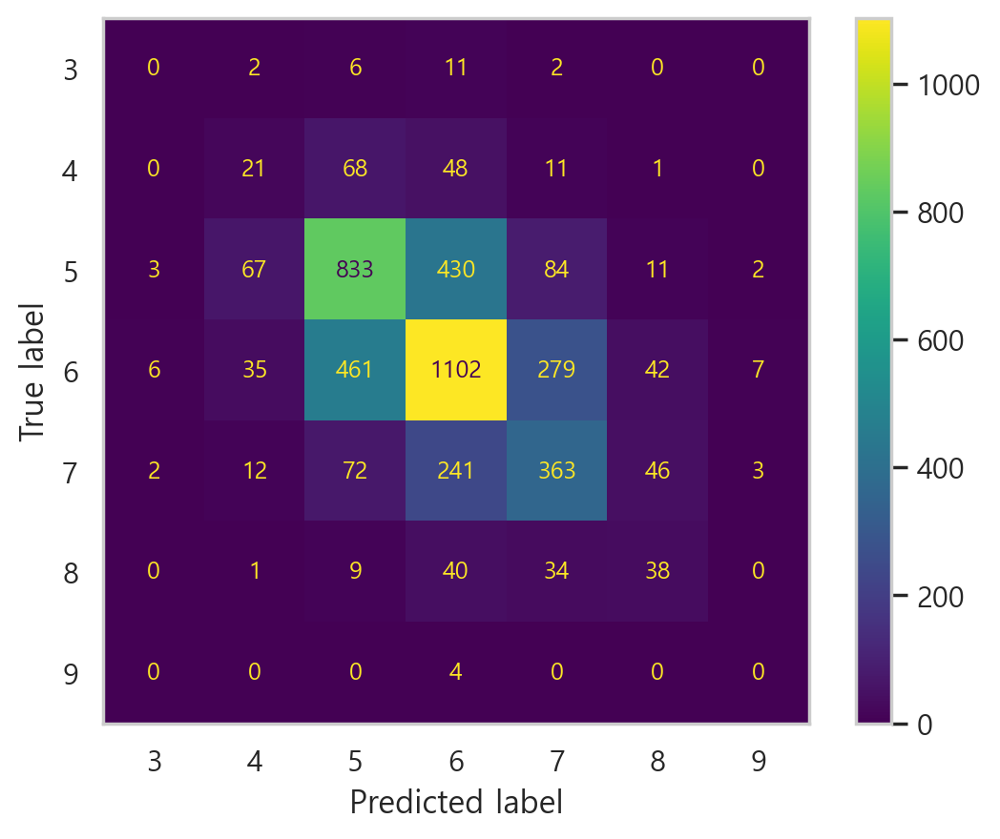

In [72]:
# 혼동행렬

from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.model_selection import cross_val_predict

wine_pred = cross_val_predict(tree_clf, wine_prepared, wine2_labels, cv=3)


plt.rc('font', size=9)  # 추가 코드 - 폰트 크기를 줄입니다
ConfusionMatrixDisplay.from_predictions(wine2_labels, wine_pred).ax_.grid(False)
plt.show()

In [73]:
from sklearn.metrics import precision_score, recall_score

precision_score(wine2_labels, wine_pred,average="weighted").round(2)

0.54

In [74]:
recall_score(wine2_labels, wine_pred,average="weighted").round(2)

0.54

In [75]:
from sklearn.metrics import f1_score

f1_score(wine2_labels, wine_pred,average="weighted").round(2)

0.54

In [76]:
# 변수 중요도 확인
a = tree_clf.feature_importances_
a

feature_names = ["type_red", "citric acid", "alcohol", "chlorides", "free sulfur dioxide", "total sulfur dioxide","residual sugar", "fixed acidity", "volatile acidity", "density", "sulphates", "pH" ]

importance = pd.DataFrame(data={'Feature': feature_names, 'Importance': a})

# 중요도 순으로 정렬
importance= importance.sort_values(by="Importance", ascending=False).reset_index(drop=True)

importance 

# alcohol 제외하고, 거의 비슷한 변수중요도, type피쳐는 사용되지 않았다 봐도 무방할듯


,Feature,Importance
0,alcohol,0.14
1,volatile acidity,0.10
2,pH,0.10
3,residual sugar,0.09
...,...,...
8,sulphates,0.08
9,chlorides,0.07
10,fixed acidity,0.07
11,type_red,0.00


tree 구조 함수를 이용해 모델 깊이 파악

In [77]:
tree = tree_clf.tree_

tree.max_depth

# 규제안가하고 썻더니 깊이가 24까지 내려갔다.

24

in test set - 위에서 test2는 전처리 파이프라인을 통과시켰음

c:\Users\zezeg\.conda\envs\datavisual\Lib\site-packages\sklearn\model_selection\_split.py:737: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


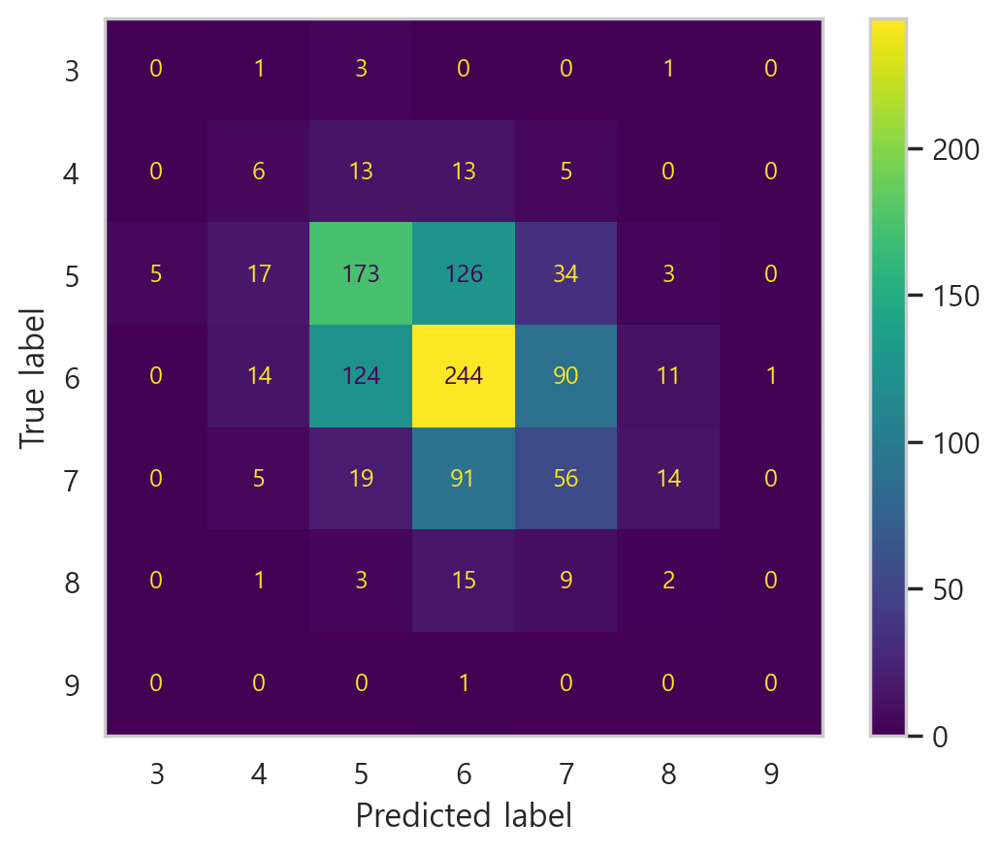

In [78]:
# test set 전처리 파이프라인 통과하였음 - test_prepared, test2_labels로 각각 정의


from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.model_selection import cross_val_predict

test_pred = cross_val_predict(tree_clf, test_prepared, test2_labels, cv=5)
plt.rc('font', size=9)  # 추가 코드 - 폰트 크기를 줄입니다
ConfusionMatrixDisplay.from_predictions(test2_labels, test_pred).ax_.grid(False)
plt.show()

In [79]:
test_accuracy = tree_clf.score(test_prepared, test2_labels)

print(f"Test Accuracy: {test_accuracy:.2f}")

Test Accuracy: 0.56


In [80]:
recall_score(test2_labels, test_pred,average="weighted").round(2)

0.44

In [81]:
f1_score(test2_labels, test_pred,average="micro").round(2)

0.44

In [82]:
# 성능 평가 함수
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score


accuracy = accuracy_score(test2_labels, test_pred)

f1 = f1_score(test2_labels, test_pred, average='weighted')

precision = precision_score(test2_labels, test_pred, average='weighted')

recall = recall_score(test2_labels, test_pred, average='weighted')


results_dict = {
    'Accuracy': [accuracy],
    'F1 Score': [f1],
    'Precision': [precision],
    'Recall': [recall]
}



results = pd.DataFrame(results_dict)

results


,Accuracy,F1 Score,Precision,Recall
0,0.44,0.44,0.44,0.44


아래 그리드서치로는 과적합됨. 좀 더 규제필요

그리드 서치로 처음부터 돌려보기

In [83]:
# 변환 파이프라인


# 범주형 피쳐 리스트
cat_at = ["type"]

# 로그 변환할 피쳐 리스트
log_at=["fixed acidity", "volatile acidity", "density", "sulphates", "pH"]

#박스콕스 변환 리스트
boxcox_at = ["citric acid", "alcohol", "chlorides", "free sulfur dioxide", "total sulfur dioxide","residual sugar"]


# 범주형 피쳐를 위한 파이프라인 - onehot encode
cat_pipeline = Pipeline([
    ("impute", SimpleImputer(strategy="most_frequent")),
    ("encode", OneHotEncoder(handle_unknown="ignore"))
])



# 박스콕스 변환 파이프라인
boxcox_pipeline = Pipeline([
    ("impute", SimpleImputer(strategy="median")),
    ("boxcox", PowerTransformer(method="box-cox")),  # 로그 변환 (np.log1p은 log(1 + x)를 계산)
    ("standardize", StandardScaler())])




# 로그 변환 파이프라인
log_pipeline = Pipeline([
    ("impute", SimpleImputer(strategy="median")),
    ("log_transform", FunctionTransformer(np.log1p, validate=True)),  # 로그 변환 (np.log1p은 log(1 + x)를 계산)
    ("standardize", StandardScaler())
])





# 전체 전처리 파이프라인 정의
preprocessing = ColumnTransformer(
    transformers=[
        ("cat", cat_pipeline, cat_at),
        ("boxcox", boxcox_pipeline, boxcox_at),  # 범주형 피쳐 파이프라인 적용
        ("log", log_pipeline, log_at)
    ]
)

# 데이터 전처리
wine_prepared = preprocessing.fit_transform(wine2)
feature_names=  ["type_red", "type_white", "citric acid", "alcohol", "chlorides", "free sulfur dioxide", "total sulfur dioxide","residual sugar", "fixed acidity", "volatile acidity", "density", "sulphates", "pH" ]



wine_prepared = pd.DataFrame(data = wine_prepared, columns = feature_names)
wine_prepared = wine_prepared.drop(columns="type_white")


full_pipe = Pipeline([
    ("preprocessing", preprocessing),
    ("tree_clf", DecisionTreeClassifier(random_state=42))
])



# 파라미터 그리드 정의
param_grid = {
    'tree_clf__max_depth': [2, 3, 4, 5, 6, 7, 8,9,10],
    'tree_clf__max_features': [3, 4 ,5 ,6, 7, 8]
}


from sklearn.model_selection import GridSearchCV


# GridSearchCV 생성
grid_search = GridSearchCV(full_pipe, param_grid, cv=3, scoring='f1_weighted')

# GridSearchCV 수행
grid_search.fit(wine2, wine2_labels)

# 최적의 하이퍼파라미터와 성능 출력
print("Best parameters found: ", grid_search.best_params_)
print("Best cross-validation f1_weighted: {:.2f}".format(grid_search.best_score_))

# 최적의 모델로 테스트 세트 예측
best_model = grid_search.best_estimator_

Best parameters found:  {'tree_clf__max_depth': 8, 'tree_clf__max_features': 7}
Best cross-validation f1_weighted: 0.53


In [84]:
# 그리드 결과로 다시 모델 훈련
from sklearn.tree import DecisionTreeClassifier

tree_clf2 = DecisionTreeClassifier(random_state= 42, max_depth= 8, max_features= 7)
tree_clf2.fit(wine_prepared, wine2_labels)

DecisionTreeClassifier(max_depth=8, max_features=7, random_state=42)

c:\Users\zezeg\.conda\envs\datavisual\Lib\site-packages\sklearn\model_selection\_split.py:737: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(


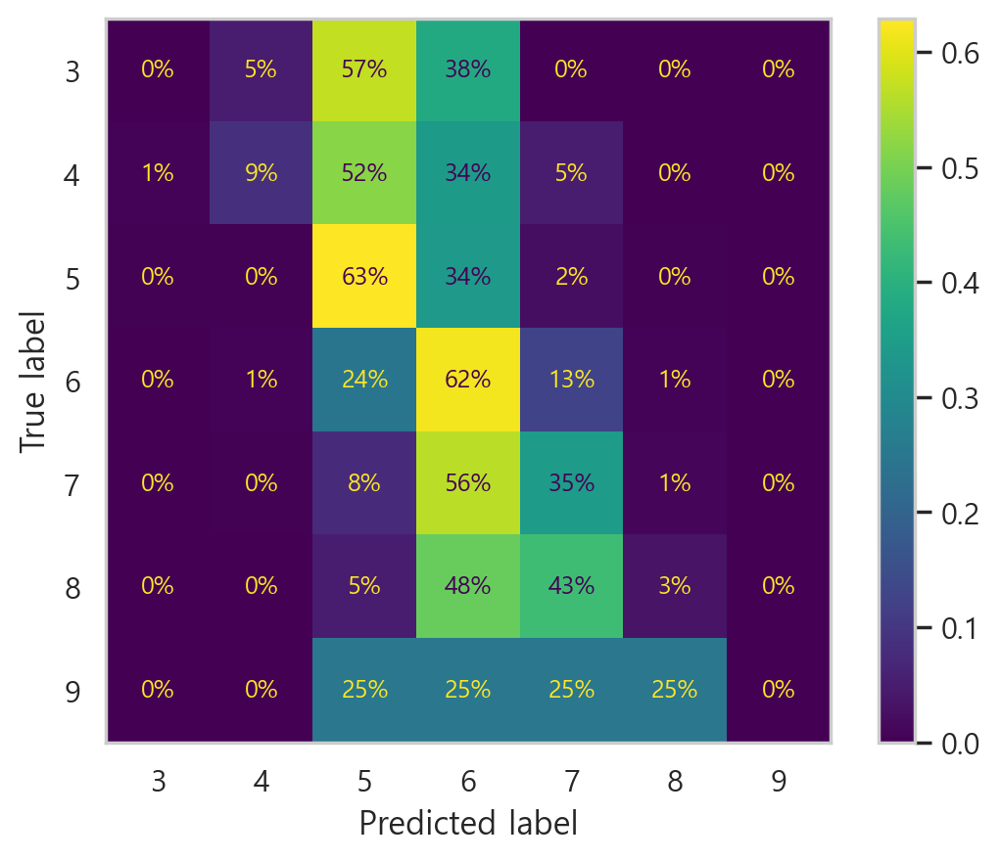

In [85]:
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.model_selection import cross_val_predict

wine2_pred = cross_val_predict(tree_clf2, wine_prepared, wine2_labels, cv=5)
plt.rc('font', size=9)  # 추가 코드 - 폰트 크기를 줄입니다
ConfusionMatrixDisplay.from_predictions(wine2_labels, wine2_pred,normalize="true", values_format=".0%" ).ax_.grid(False)
plt.show()

훈련셋 성능 요약

In [86]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score


accuracy = accuracy_score(wine2_labels, wine2_pred)

f1 = f1_score(wine2_labels, wine2_pred, average='weighted')

precision = precision_score(wine2_labels, wine2_pred, average='weighted')

recall = recall_score(wine2_labels, wine2_pred, average='weighted')


results_dict = {
    'Accuracy': [accuracy],
    'F1 Score': [f1],
    'Precision': [precision],
    'Recall': [recall]
}



results = pd.DataFrame(results_dict)

results


c:\Users\zezeg\.conda\envs\datavisual\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


,Accuracy,F1 Score,Precision,Recall
0,0.54,0.52,0.52,0.54


c:\Users\zezeg\.conda\envs\datavisual\Lib\site-packages\sklearn\model_selection\_split.py:737: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


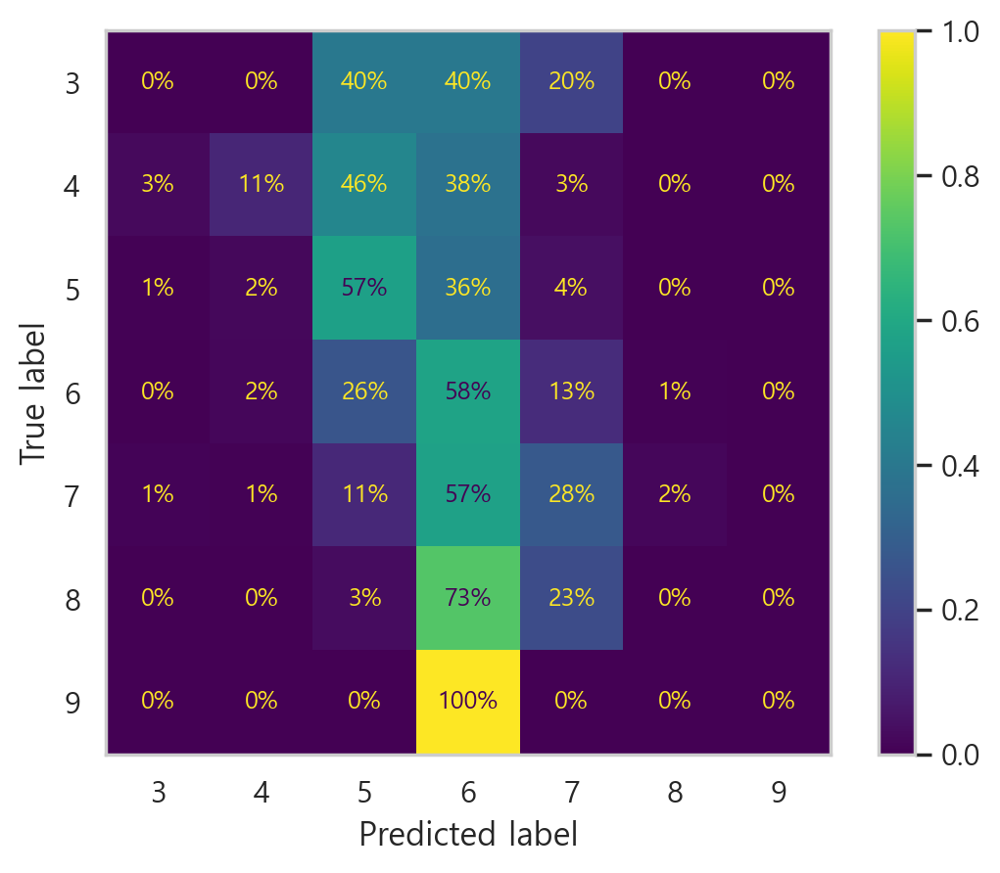

In [87]:
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.model_selection import cross_val_predict

test_pred = cross_val_predict(tree_clf2, test_prepared, test2_labels, cv=5)

plt.rc('font', size=9)  # 추가 코드 - 폰트 크기를 줄입니다
ConfusionMatrixDisplay.from_predictions(test2_labels, test_pred,normalize="true", values_format=".0%").ax_.grid(False)
plt.show()

In [1]:
# 성능 평가 함수
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score


accuracy = accuracy_score(test2_labels, test_pred)

f1 = f1_score(test2_labels, test_pred, average='weighted')

precision = precision_score(test2_labels, test_pred, average='micro')

recall = recall_score(test2_labels, test_pred, average='micro')


results_dict = {
    'Accuracy': [accuracy],
    'F1 Score': [f1],
    'Precision': [precision],
    'Recall': [recall]
}



results = pd.DataFrame(results_dict)

results

NameError: name 'test2_labels' is not defined

### RandomForest

In [89]:
from sklearn.ensemble import RandomForestClassifier

forest_clf = RandomForestClassifier(random_state= 42)

wine_prepared = preprocessing.fit_transform(wine2)
feature_names=  ["type_red", "type_white", "citric acid", "alcohol", "chlorides", "free sulfur dioxide", "total sulfur dioxide","residual sugar", "fixed acidity", "volatile acidity", "density", "sulphates", "pH" ]



wine_prepared = pd.DataFrame(data = wine_prepared, columns = feature_names)
wine_prepared = wine_prepared.drop(columns="type_white")

forest_clf.fit(wine_prepared, wine2_labels)

RandomForestClassifier(random_state=42)

In [90]:
accuracy = forest_clf.score(wine_prepared, wine2_labels)
print(f"Accuracy: {accuracy:.2f}")

Accuracy: 1.00


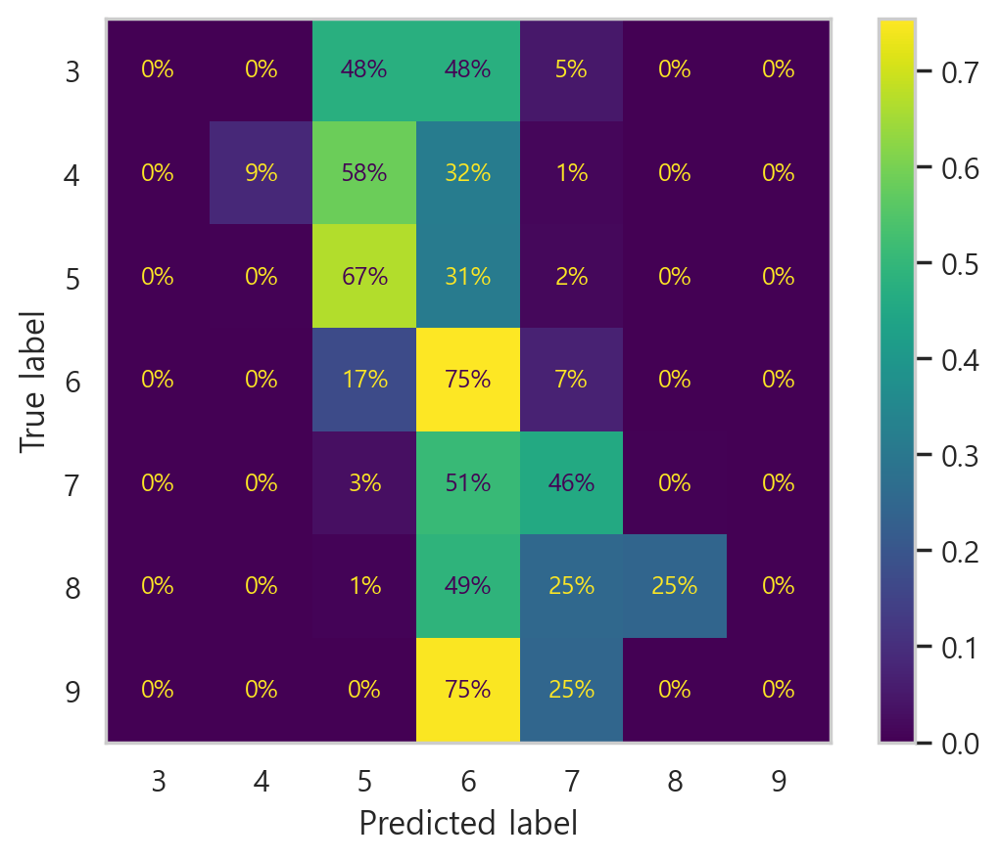

In [91]:
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.model_selection import cross_val_predict

wine_pred = cross_val_predict(forest_clf, wine_prepared, wine2_labels, cv=3)
plt.rc('font', size=9)  # 추가 코드 - 폰트 크기를 줄입니다
ConfusionMatrixDisplay.from_predictions(wine2_labels, wine_pred,normalize="true", values_format=".0%").ax_.grid(False)
plt.show()

# normalize - 주대각선이 정확도를 나타내게 해줌

# 여기선 3, 4, 8 class를 거의 잡아내지 못한 것으로 보임

In [92]:
# 변수 중요도 확인
a = forest_clf.feature_importances_
a

feature_names = ["type_red", "citric acid", "alcohol", "chlorides", "free sulfur dioxide", "total sulfur dioxide","residual sugar", "fixed acidity", "volatile acidity", "density", "sulphates", "pH" ]

importance = pd.DataFrame(data={'Feature': feature_names, 'Importance': a})

# 중요도 순으로 정렬
importance= importance.sort_values(by="Importance", ascending=False).reset_index(drop=True)

importance 


,Feature,Importance
0,alcohol,0.13
1,density,0.11
2,volatile acidity,0.10
3,total sulfur dioxide,0.09
...,...,...
8,sulphates,0.08
9,citric acid,0.08
10,fixed acidity,0.07
11,type_red,0.00


In [93]:
from sklearn.metrics import precision_score, recall_score

precision_score(wine2_labels, wine_pred,average="weighted").round(2)

c:\Users\zezeg\.conda\envs\datavisual\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


0.64

In [94]:
f1_score(wine2_labels, wine_pred,average="weighted").round(2)

0.62

In [95]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score


accuracy = accuracy_score(wine2_labels, wine_pred)

f1 = f1_score(wine2_labels, wine_pred, average='weighted')

precision = precision_score(wine2_labels, wine_pred, average='weighted')

recall = recall_score(wine2_labels, wine_pred, average='weighted')


results_dict = {
    'Accuracy': [accuracy],
    'F1 Score': [f1],
    'Precision': [precision],
    'Recall': [recall]
}



results = pd.DataFrame(results_dict)

results

#

c:\Users\zezeg\.conda\envs\datavisual\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


,Accuracy,F1 Score,Precision,Recall
0,0.64,0.62,0.64,0.64


test data

c:\Users\zezeg\.conda\envs\datavisual\Lib\site-packages\sklearn\model_selection\_split.py:737: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=3.
  warnings.warn(


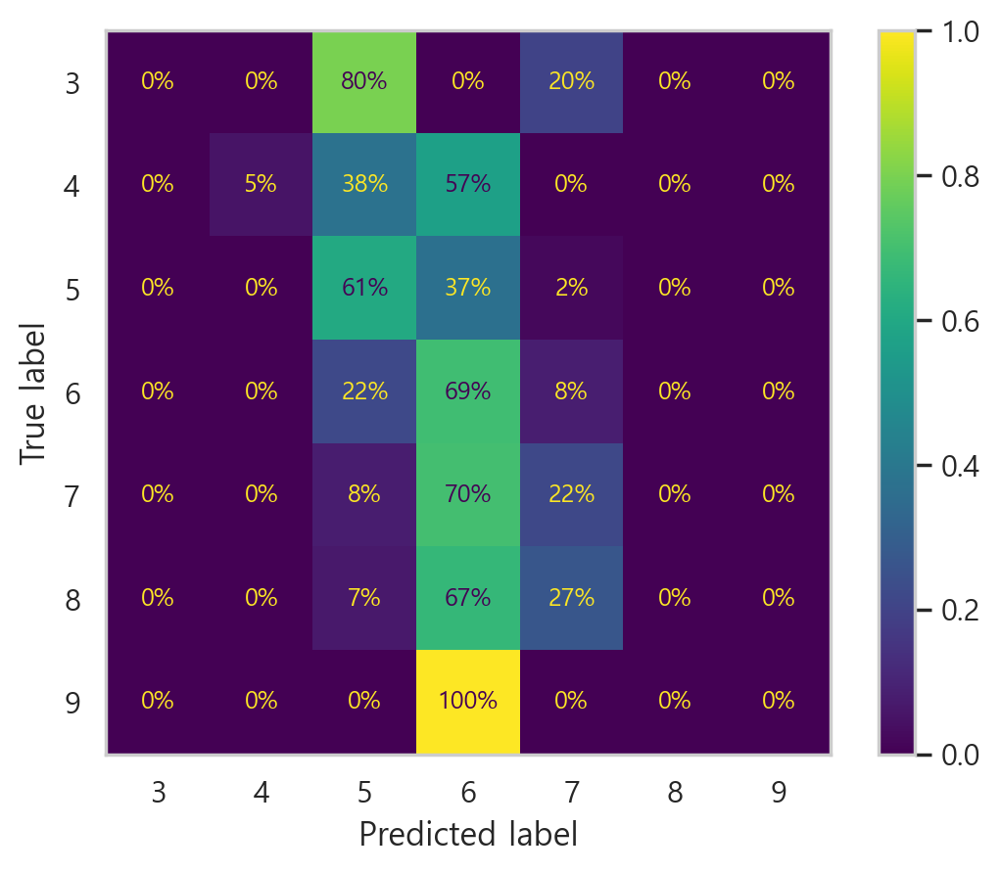

In [96]:
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.model_selection import cross_val_predict

test_pred = cross_val_predict(forest_clf, test_prepared, test2_labels, cv=3)
plt.rc('font', size=9)  # 추가 코드 - 폰트 크기를 줄입니다
ConfusionMatrixDisplay.from_predictions(test2_labels, test_pred,normalize="true", values_format=".0%").ax_.grid(False)
plt.show()

In [97]:
# 성능 평가 함수
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score


accuracy = accuracy_score(test2_labels, test_pred)

f1 = f1_score(test2_labels, test_pred, average='weighted')

precision = precision_score(test2_labels, test_pred, average='weighted')

recall = recall_score(test2_labels, test_pred, average='micro')


results_dict = {
    'Accuracy': [accuracy],
    'F1 Score': [f1],
    'Precision': [precision],
    'Recall': [recall]
}



results = pd.DataFrame(results_dict)

results

c:\Users\zezeg\.conda\envs\datavisual\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


,Accuracy,F1 Score,Precision,Recall
0,0.54,0.51,0.52,0.54


In [98]:
f1_score(test2_labels, test_pred,average="weighted") 

#너무 과적합된것으로 ㄹ보임

0.5109642890003868

random forest grid search(처음부터 끝까지)

In [99]:


# 데이터 전처리
wine_prepared = preprocessing.fit_transform(wine2)
feature_names=  ["type_red", "type_white", "citric acid", "alcohol", "chlorides", "free sulfur dioxide", "total sulfur dioxide","residual sugar", "fixed acidity", "volatile acidity", "density", "sulphates", "pH" ]



wine_prepared = pd.DataFrame(data = wine_prepared, columns = feature_names)
wine_prepared = wine_prepared.drop(columns="type_white")



full_pipe = Pipeline([
    ("forest_clf", RandomForestClassifier(random_state=42))
])



# 파라미터 그리드 정의
param_grid = {
    'forest_clf__max_depth': np.arange(1,8),
    'forest_clf__max_features': np.arange(2,10)
}

from sklearn.model_selection import GridSearchCV
# GridSearchCV 생성
grid_search = GridSearchCV(full_pipe, param_grid, cv=3, scoring='f1_weighted')

# GridSearchCV 수행
grid_search.fit(wine_prepared, wine2_labels)

# 최적의 하이퍼파라미터와 성능 출력
print("Best parameters found: ", grid_search.best_params_)
print("Best cross-validation F1 score: {:.2f}".format(grid_search.best_score_))

# 최적의 모델로 테스트 세트 예측
best_model = grid_search.best_estimator_

Best parameters found:  {'forest_clf__max_depth': 7, 'forest_clf__max_features': 9}
Best cross-validation F1 score: 0.55


그리드 서치 결과를 통해 다시 훈련시켜보자

In [100]:
forest_clf2 =RandomForestClassifier(random_state= 42, max_depth= 7, max_features= 9)
forest_clf2.fit(wine_prepared, wine2_labels)

RandomForestClassifier(max_depth=7, max_features=9, random_state=42)

In [101]:
a = forest_clf2.feature_importances_
a

feature_names = ["type_red", "citric acid", "alcohol", "chlorides", "free sulfur dioxide", "total sulfur dioxide","residual sugar", "fixed acidity", "volatile acidity", "density", "sulphates", "pH" ]

importance = pd.DataFrame(data={'Feature': feature_names, 'Importance': a})

# 중요도 순으로 정렬
importance= importance.sort_values(by="Importance", ascending=False).reset_index(drop=True)

importance 

,Feature,Importance
0,alcohol,0.30
1,volatile acidity,0.15
2,density,0.08
3,residual sugar,0.07
...,...,...
8,pH,0.06
9,citric acid,0.05
10,fixed acidity,0.04
11,type_red,0.00


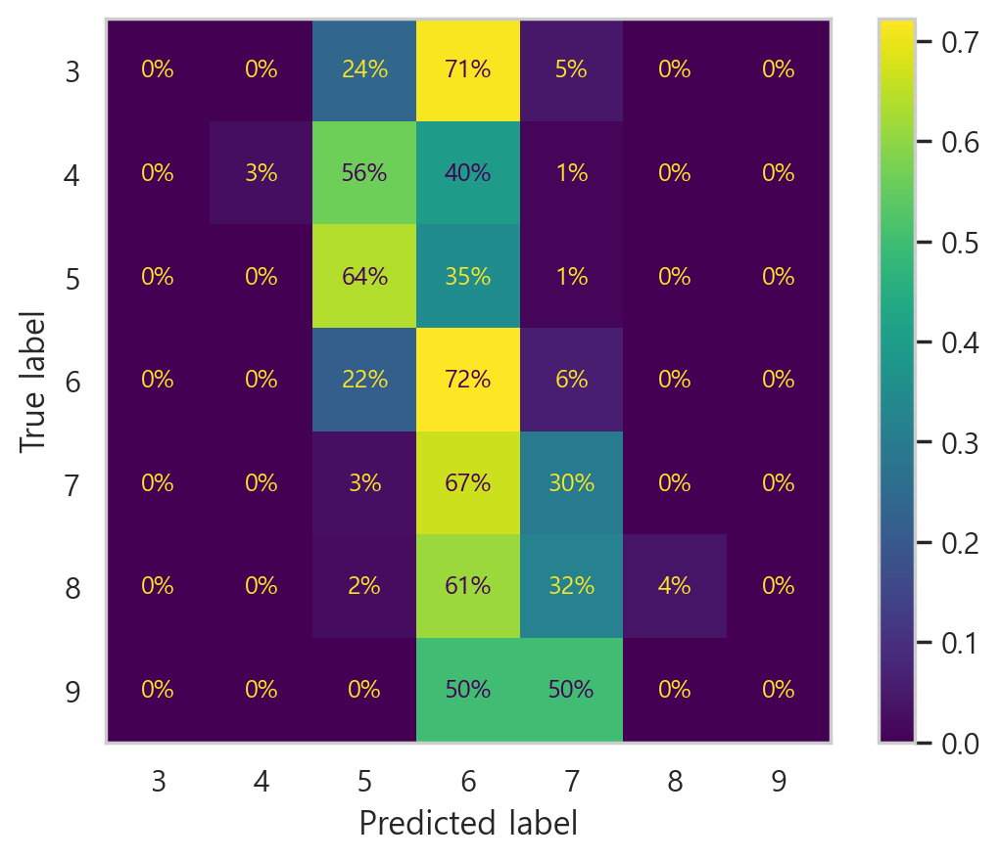

In [102]:
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.model_selection import cross_val_predict

wine_pred2 = cross_val_predict(forest_clf2, wine_prepared, wine2_labels, cv=3)
plt.rc('font', size=9)  # 추가 코드 - 폰트 크기를 줄입니다
ConfusionMatrixDisplay.from_predictions(wine2_labels,wine_pred2,normalize="true", values_format=".0%").ax_.grid(False)
plt.show()

In [103]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score


accuracy = accuracy_score(wine2_labels, wine_pred2)

f1 = f1_score(wine2_labels, wine_pred2, average='weighted')

precision = precision_score(wine2_labels, wine_pred2, average='weighted')

recall = recall_score(wine2_labels, wine_pred2, average='weighted')


results_dict = {
    'Accuracy': [accuracy],
    'F1 Score': [f1],
    'Precision': [precision],
    'Recall': [recall]
}



results = pd.DataFrame(results_dict)

results


c:\Users\zezeg\.conda\envs\datavisual\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


,Accuracy,F1 Score,Precision,Recall
0,0.58,0.55,0.59,0.58


In [104]:
f1_score(wine2_labels, wine_pred2,average="weighted")

0.5503722568112397

in test set

c:\Users\zezeg\.conda\envs\datavisual\Lib\site-packages\sklearn\model_selection\_split.py:737: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=3.
  warnings.warn(


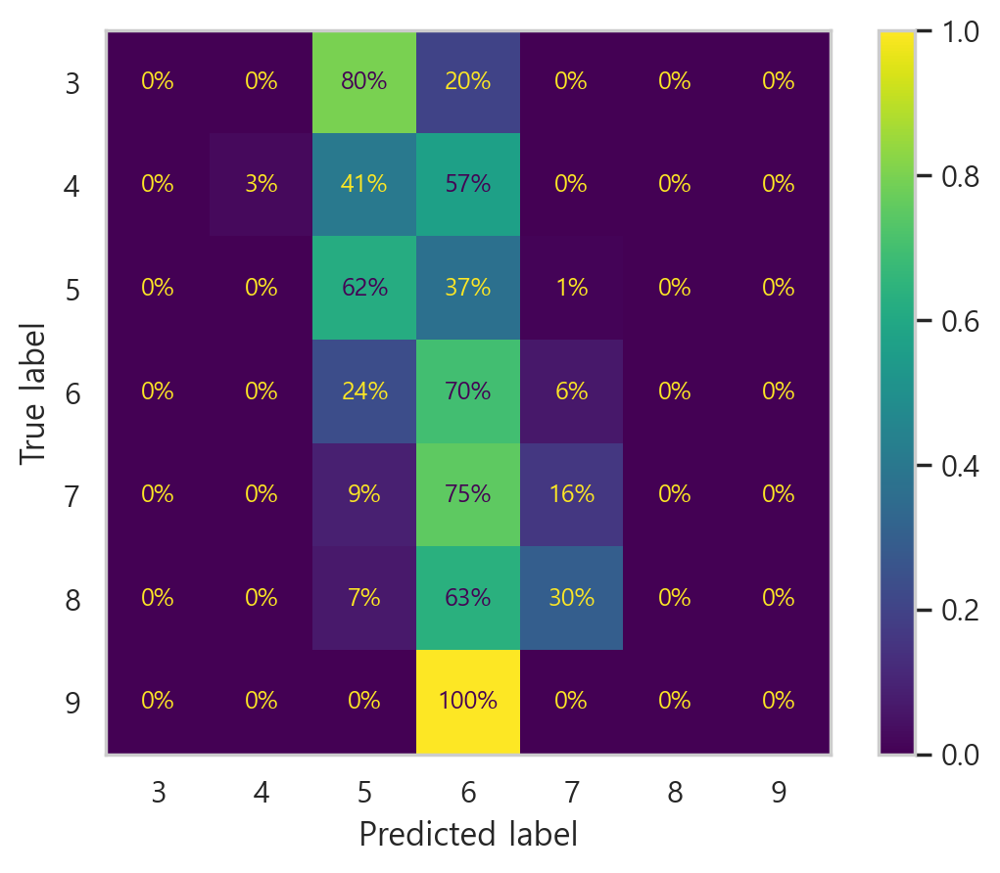

In [105]:
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.model_selection import cross_val_predict

test_pred2 = cross_val_predict(forest_clf2, test_prepared, test2_labels, cv=3)
plt.rc('font', size=9)  # 추가 코드 - 폰트 크기를 줄입니다
ConfusionMatrixDisplay.from_predictions(test2_labels,test_pred2,normalize="true", values_format=".0%").ax_.grid(False)
plt.show()

In [106]:
# 성능 평가 함수
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score


accuracy = accuracy_score(test2_labels, test_pred2)

f1 = f1_score(test2_labels, test_pred2, average='weighted')

precision = precision_score(test2_labels, test_pred2, average='micro')

recall = recall_score(test2_labels, test_pred2, average='micro')


results_dict = {
    'Accuracy': [accuracy],
    'F1 Score': [f1],
    'Precision': [precision],
    'Recall': [recall]
}



results = pd.DataFrame(results_dict)

results

,Accuracy,F1 Score,Precision,Recall
0,0.54,0.50,0.54,0.54


In [107]:
f1_score(test2_labels, test_pred2,average="weighted")

0.5001999033377215

모델의 파라미터 조정만으로는, 애초에 적은 샘플만 뽑힌 3,4,8,9를 구분할 수 없을듯 함. 

즉, 이쪽 정확도를 올릴 수가 없음

우선 샘플링부터 다시 해봐야 할듯.

### oversampling / undersampling




In [108]:
wine1.shape

(5497, 13)

In [109]:
5497 * 0.8

4397.6

In [110]:
wine11_3 = wine11[wine11.quality==3]                
wine11_4 = wine11[wine11.quality==4]  
wine11_5 = wine11[wine11.quality==5]       # 대다수
wine11_6 = wine11[wine11.quality==6]       # 대다수
wine11_7 = wine11[wine11.quality==7]
wine11_8 = wine11[wine11.quality==8]       
wine11_9 = wine11[wine11.quality==9] 

from sklearn.utils import resample

df_3_upsampled = resample(wine11_3, replace=True, n_samples=100, random_state=12) 
df_4_upsampled = resample(wine11_4, replace=True, n_samples=600, random_state=12) 
df_7_upsampled = resample(wine11_7, replace=True, n_samples=600, random_state=12) 
df_8_upsampled = resample(wine11_8, replace=True, n_samples=200, random_state=12) 
df_9_upsampled = resample(wine11_9, replace=True, n_samples=100, random_state=12) 

# 언더샘플링 
df_5_downsampled = wine11[wine11.quality==5].sample(n=1300).reset_index(drop=True)
df_6_downsampled = wine11[wine11.quality==6].sample(n=1300).reset_index(drop=True)

Balanced_df = pd.concat([df_3_upsampled, df_4_upsampled, df_7_upsampled, 
                         df_8_upsampled,df_9_upsampled, df_5_downsampled, df_6_downsampled]).reset_index(drop=True)


# 레이블 밸런스 맞추기 완료!

In [111]:
Balanced_df

,quality,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,type
0,3,8.30,0.34,0.32,3.40,0.08,6.00,11.00,1.00,3.48,0.49,11.00,red
1,3,7.60,0.48,0.37,1.20,0.03,5.00,57.00,0.99,3.05,0.54,10.40,white
2,3,6.70,0.25,0.26,1.55,0.04,30.42,216.00,0.99,3.55,0.63,9.40,white
3,3,9.40,0.24,0.29,8.50,0.04,30.42,208.00,0.99,2.90,0.38,11.00,white
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4196,6,6.40,0.28,0.56,1.70,0.06,49.00,106.00,0.99,3.10,0.37,9.20,white
4197,6,6.20,0.27,0.43,7.80,0.06,48.00,244.00,1.00,3.10,0.51,9.00,white
4198,6,6.30,0.32,0.17,5.44,0.06,51.00,190.00,1.00,3.13,0.48,8.80,white
4199,6,6.60,0.28,0.09,10.90,0.05,37.00,131.00,1.00,2.93,0.62,9.50,white


In [203]:
# 이상값 없앤 원 데이터를 훈련 셋과 테스트셋으로 분리 

from sklearn.model_selection import train_test_split
strat_train_set, strat_test_set = train_test_split(wine11, test_size = 0.2, random_state=42)


# 언더/오버샘플링한 훈련 데이터셋
from sklearn.model_selection import train_test_split
strat_train_set2, strat_test_set2 = train_test_split(Balanced_df, test_size = 0.2, random_state=42)


# 훈련 레이블
wine5 = strat_train_set2.drop("quality", axis = 1)
wine5_labels = strat_train_set2["quality"].copy()

# 테스트 레이블
test5 = strat_test_set.drop("quality", axis = 1)
test5_labels = strat_test_set["quality"].copy()

# 변환 파이프라인


# 범주형 피쳐 리스트
cat_at = ["type"]

# 로그 변환할 피쳐 리스트
log_at=["fixed acidity", "volatile acidity", "density", "sulphates", "pH"]

#박스콕스 변환 리스트
boxcox_at = ["citric acid", "alcohol", "chlorides", "free sulfur dioxide", "total sulfur dioxide","residual sugar"]


# 범주형 피쳐를 위한 파이프라인 - onehot encode
cat_pipeline = Pipeline([
    ("impute", SimpleImputer(strategy="most_frequent")),
    ("encode", OneHotEncoder(handle_unknown="ignore"))
])



# 박스콕스 변환 파이프라인
boxcox_pipeline = Pipeline([
    ("impute", SimpleImputer(strategy="median")),
    ("boxcox", PowerTransformer(method="box-cox")),  # 로그 변환 (np.log1p은 log(1 + x)를 계산)
    ("standardize", StandardScaler())])




# 로그 변환 파이프라인
log_pipeline = Pipeline([
    ("impute", SimpleImputer(strategy="median")),
    ("log_transform", FunctionTransformer(np.log1p, validate=True)),  # 로그 변환 (np.log1p은 log(1 + x)를 계산)
    ("standardize", StandardScaler())
])


# 전체 전처리 파이프라인 정의
preprocessing = ColumnTransformer(
    transformers=[
        ("cat", cat_pipeline, cat_at),
        ("boxcox", boxcox_pipeline, boxcox_at),  # 범주형 피쳐 파이프라인 적용
        ("log", log_pipeline, log_at)
    ]
)

In [156]:

# 모델에 대입
full_pipe = Pipeline([
    ("preprocessing", preprocessing),
    ("forest_clf3", RandomForestClassifier(random_state=42))
])



# 파라미터 그리드 정의
param_grid = {
    'forest_clf3__max_depth': [3,4,5,6,7,8,9],
    'forest_clf3__max_features':[2,3,4,5,6,7,8,9,10,11,12]
}

from sklearn.model_selection import GridSearchCV
# GridSearchCV 생성
grid_search = GridSearchCV(full_pipe, param_grid, cv=3, scoring='f1_weighted')

# GridSearchCV 수행
grid_search.fit(wine5, wine5_labels)

# 최적의 하이퍼파라미터와 성능 출력
print("Best parameters found: ", grid_search.best_params_)
print("Best cross-validation F1 score: {:.2f}".format(grid_search.best_score_))

# 최적의 모델로 테스트 세트 예측
best_model = grid_search.best_estimator_

Best parameters found:  {'forest_clf3__max_depth': 9, 'forest_clf3__max_features': 6}
Best cross-validation F1 score: 0.63


In [157]:
wine5 = preprocessing.fit_transform(wine5)

names = ["type_red", "type_white","citric acid", "alcohol", "chlorides", "free sulfur dioxide", "total sulfur dioxide","residual sugar", "fixed acidity", "volatile acidity", "density", "sulphates", "pH" ]

wine5 = pd.DataFrame(wine5, columns=names)

wine5 = wine5.drop(columns="type_white")

In [200]:

forest_clf3 =RandomForestClassifier(random_state= 42, max_depth= 9, max_features= 6)
forest_clf3.fit(wine5, wine5_labels)

RandomForestClassifier(max_depth=9, max_features=6, random_state=42)

In [201]:
a = forest_clf3.feature_importances_

feature_names = ["type_red", "citric acid", "alcohol", "chlorides", "free sulfur dioxide", "total sulfur dioxide","residual sugar", "fixed acidity", "volatile acidity", "density", "sulphates", "pH" ]

importance = pd.DataFrame({
    'Feature': feature_names,
    'Importance': a
})
importance.sort_values(by="Importance",ascending=False).reset_index(drop=True)



,Feature,Importance
0,alcohol,0.17
1,volatile acidity,0.11
2,free sulfur dioxide,0.10
3,density,0.09
...,...,...
8,total sulfur dioxide,0.08
9,fixed acidity,0.07
10,citric acid,0.06
11,type_red,0.00


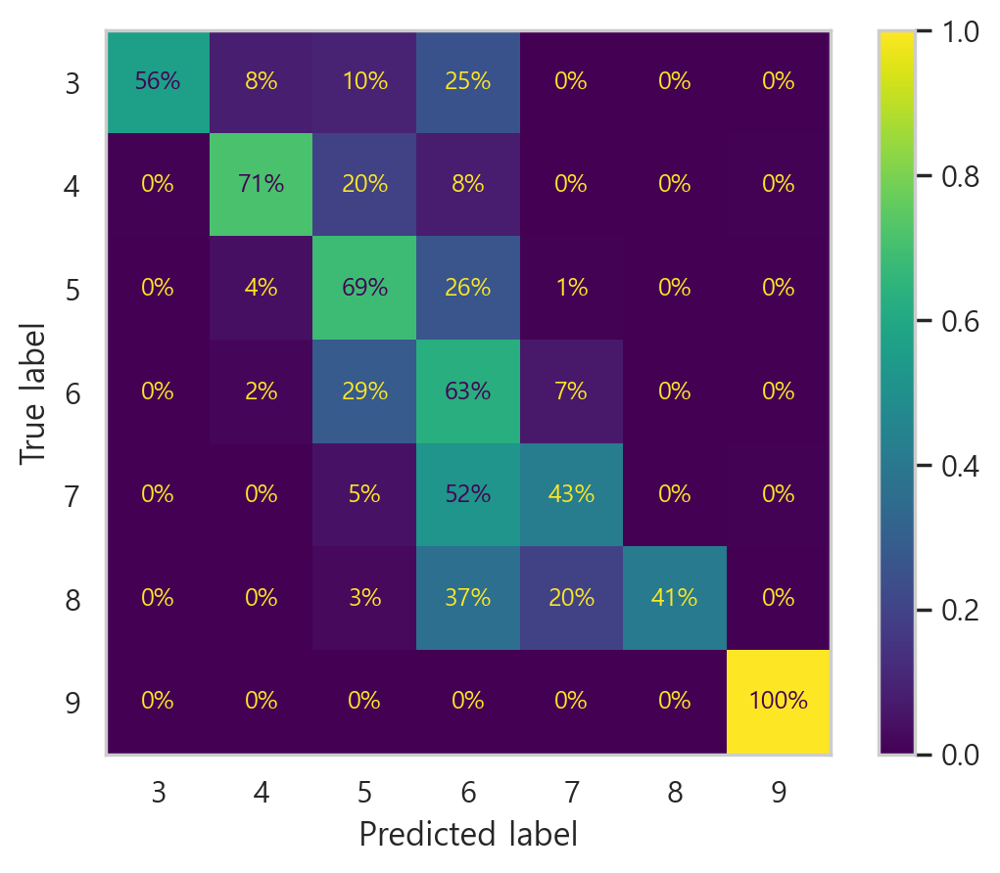

In [202]:
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.model_selection import cross_val_predict



# k fold 교차검증 결과
wine_pred5 = cross_val_predict(forest_clf3, wine5, wine5_labels, cv=3)
plt.rc('font', size=9)  # 추가 코드 - 폰트 크기를 줄입니다
ConfusionMatrixDisplay.from_predictions(wine5_labels, wine_pred5,normalize="true", values_format=".0%").ax_.grid(False)
plt.show()

In [164]:
f1_score(wine5_labels, wine_pred5 ,average="weighted")

0.6268393086204878

in test set


In [204]:
test5 = preprocessing.fit_transform(test5)

names = ["type_red", "type_white","citric acid", "alcohol", "chlorides", "free sulfur dioxide", "total sulfur dioxide","residual sugar", "fixed acidity", "volatile acidity", "density", "sulphates", "pH" ]

test5 = pd.DataFrame(test5, columns=names)

test5 = test5.drop(columns="type_white")

In [205]:
forest_clf3.fit(test5, test5_labels)
pred5 = forest_clf3.predict(test5)

In [209]:
# 성능 평가 함수
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score

# 정확도, F1 점수, 정밀도, 재현율 계산
accuracy = accuracy_score(test5_labels, pred5)
f1 = f1_score(test5_labels, pred5, average='weighted')
precision = precision_score(test5_labels, pred5, average='weighted')
recall = recall_score(test5_labels, pred5, average='weighted')

# 결과를 딕셔너리로 저장
results_dict = {
    'Accuracy': [accuracy],
    'F1 Score': [f1],
    'Precision': [precision],
    'Recall': [recall]
}

# 데이터프레임으로 변환
results = pd.DataFrame(results_dict)

# 결과 출력
print(results)


   Accuracy  F1 Score  Precision  Recall
0      0.92      0.92       0.92    0.92


c:\Users\zezeg\.conda\envs\datavisual\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [210]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
cm = confusion_matrix(test5_labels, pred5)
cm

array([[  1,   0,   0,   2,   0,   0,   0],
       [  0,  27,   6,   2,   0,   0,   0],
       [  0,   0, 328,  21,   2,   0,   0],
       [  0,   0,  13, 479,   1,   0,   0],
       [  0,   0,   1,  28, 154,   0,   0],
       [  0,   0,   0,  11,   2,  21,   0],
       [  0,   0,   0,   0,   1,   0,   0]], dtype=int64)

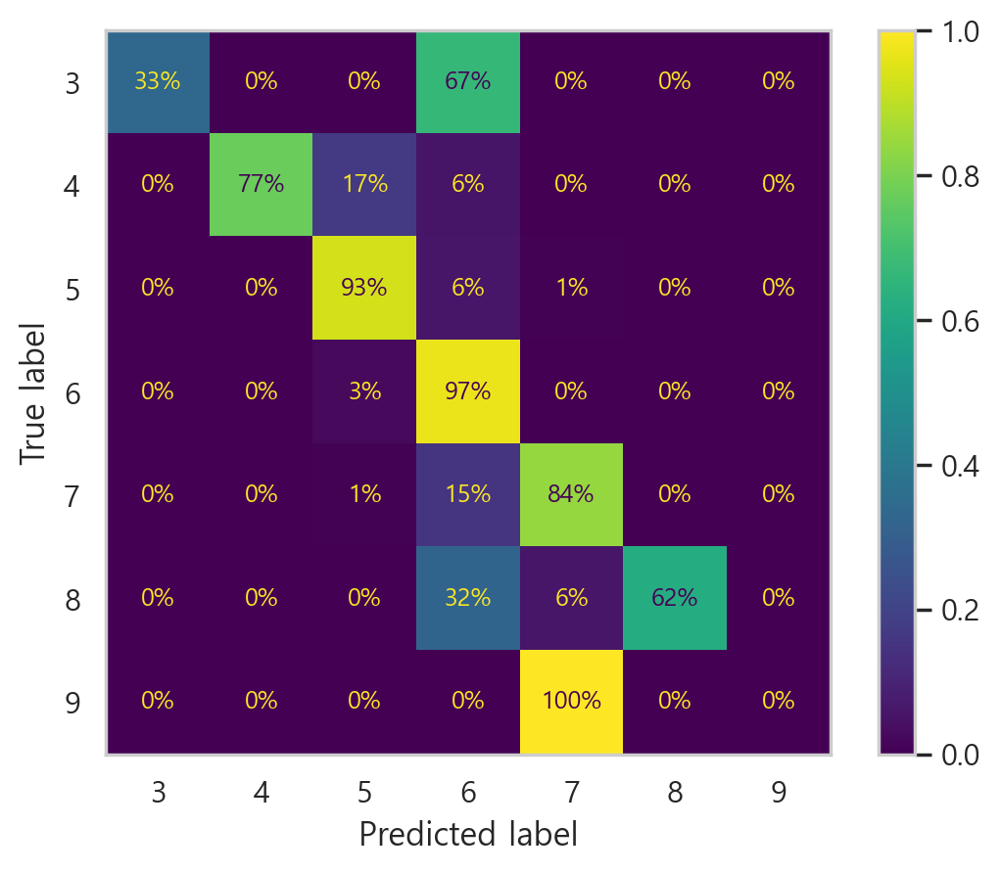

In [211]:
plt.rc('font', size=9)  # 추가 코드 - 폰트 크기를 줄입니다
ConfusionMatrixDisplay.from_predictions(test5_labels, pred5, normalize="true", values_format=".0%").ax_.grid(False)
plt.show()

#### oversampling(2)

In [213]:
# imbalanced-learn 패키지
from imblearn.over_sampling import SMOTE

# 검증 데이터나 테스트 데이터가 아닌 학습데이터에서만 오버샘플링 사용할 것
smote = SMOTE(random_state=42, k_neighbors=2)
X_train = wine_prepared
y_train = wine2_labels
X_train_over, y_train_over = smote.fit_resample(X_train, y_train)

In [214]:
from sklearn.model_selection import train_test_split
strat_train_set, strat_test_set = train_test_split(wine11, test_size = 0.2, random_state=42)

# 테스트 레이블
test5 = strat_test_set.drop("quality", axis = 1)
test5_labels = strat_test_set["quality"].copy()

In [215]:
# 모델에 대입
full_pipe = Pipeline([
    ("forest_clf3", RandomForestClassifier(random_state=42))
])



# 파라미터 그리드 정의
param_grid = {
    'forest_clf3__max_depth': [5,6,7,8,9],
    'forest_clf3__max_features':[2,3,4,5,6,7,8]
}

from sklearn.model_selection import GridSearchCV
# GridSearchCV 생성
grid_search = GridSearchCV(full_pipe, param_grid, cv=3, scoring='f1_weighted')

# GridSearchCV 수행
grid_search.fit(X_train_over, y_train_over)

# 최적의 하이퍼파라미터와 성능 출력
print("Best parameters found: ", grid_search.best_params_)
print("Best cross-validation F1 score: {:.2f}".format(grid_search.best_score_))

# 최적의 모델로 테스트 세트 예측
best_model = grid_search.best_estimator_

KeyboardInterrupt: 

In [ ]:
wine2_labels.value_counts()

quality
6    1932
5    1430
7     739
4     149
8     122
3      21
9       4
Name: count, dtype: int64

In [ ]:
y_train_over.value_counts()

quality
5    1932
7    1932
6    1932
4    1932
8    1932
9    1932
3    1932
Name: count, dtype: int64

모델

In [216]:
forest_clff =RandomForestClassifier(random_state= 42, max_depth= 9, max_features= 6)
forest_clff.fit(X_train_over, y_train_over)
wine_pred2 = forest_clff.predict(X_train_over)



In [217]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score


accuracy = accuracy_score(y_train_over, wine_pred2)

f1 = f1_score(y_train_over, wine_pred2,average="weighted")

precision = precision_score(y_train_over, wine_pred2,average="weighted")

recall = recall_score(y_train_over, wine_pred2,average="weighted")


results_dict = {
    'Accuracy': [accuracy],
    'F1 Score': [f1],
    'Precision': [precision],
    'Recall': [recall]
}



results = pd.DataFrame(results_dict)

results

,Accuracy,F1 Score,Precision,Recall
0,0.86,0.86,0.87,0.86


In [218]:
from sklearn.model_selection import train_test_split
strat_train_set, strat_test_set = train_test_split(wine11, test_size = 0.2, random_state=42)

# 테스트 레이블
test5 = strat_test_set.drop("quality", axis = 1)
test5_labels = strat_test_set["quality"].copy()


test5 = preprocessing.fit_transform(test5)
feature_names=  ["type_red", "type_white", "citric acid", "alcohol", "chlorides", "free sulfur dioxide", "total sulfur dioxide","residual sugar", "fixed acidity", "volatile acidity", "density", "sulphates", "pH" ]

test5 = pd.DataFrame(data = test5, columns = feature_names)
test5 = test5.drop(columns="type_white")



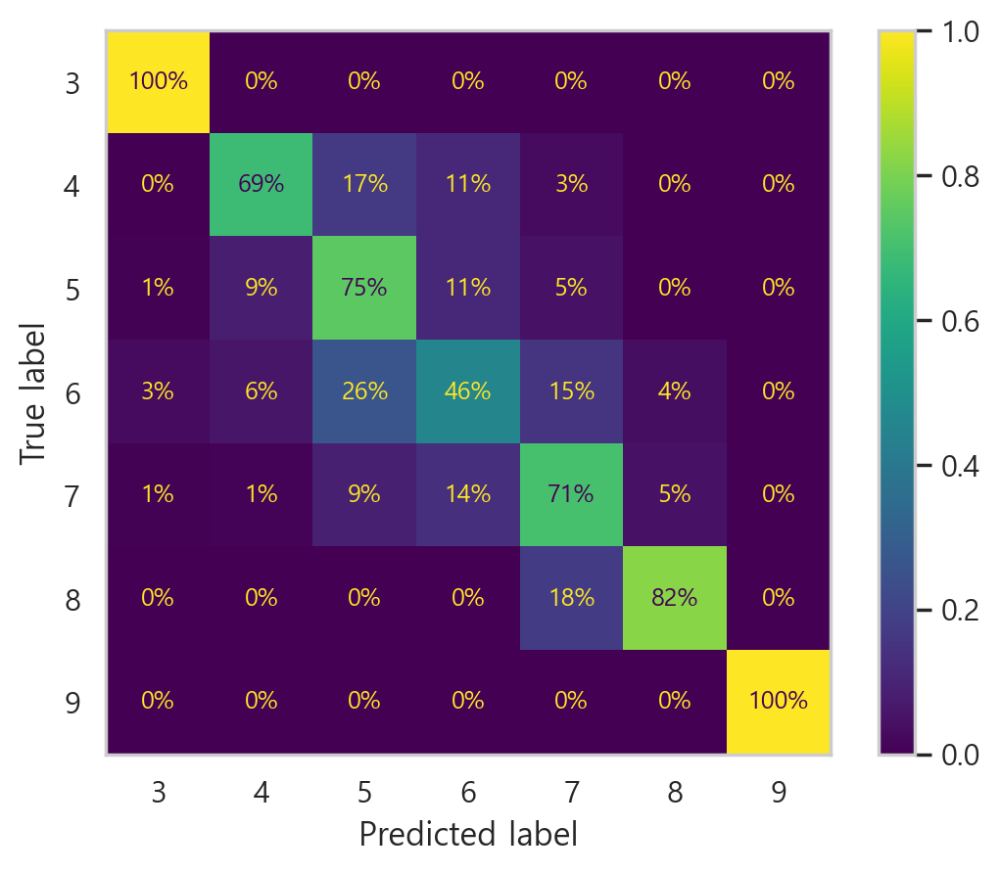

In [219]:
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.model_selection import cross_val_predict


test5_pred = forest_clff.predict(test5)


plt.rc('font', size=9)  # 추가 코드 - 폰트 크기를 줄입니다
ConfusionMatrixDisplay.from_predictions(test5_labels, test5_pred, normalize="true", values_format=".0%").ax_.grid(False)
plt.show()

In [220]:
accuracy = accuracy_score(test5_labels, test5_pred)

f1 = f1_score(test5_labels, test5_pred, average='weighted')

precision = precision_score(test5_labels, test5_pred, average='weighted',)

recall = recall_score(test5_labels, test5_pred, average='weighted')

# 결과 저장
results_dict = {
    'Accuracy': [accuracy],
    'F1 Score': [f1],
    'Precision': [precision],
    'Recall': [recall]
}

results = pd.DataFrame(results_dict)

print(results)

   Accuracy  F1 Score  Precision  Recall
0      0.61      0.61       0.67    0.61


결과가 그리 좋지 않다. k fold 교차 검증을 통해 효과적인 모델들을 더 살펴보자.

### 교차검증을 통한 모델 재탐색

In [222]:

from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_validate
from sklearn.model_selection import KFold, cross_val_score
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import warnings

In [224]:
warnings.filterwarnings("ignore")



# 특징과 타겟 변수 분리
X = X_train
y = y_train


kf = KFold(n_splits=3, shuffle =True, random_state=42)





# 데이터 분할
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

models = {
    'Logistic Regression': LogisticRegression(max_iter=1000),
    'Decision Tree': DecisionTreeClassifier(),
    'Random Forest': RandomForestClassifier(),
    'SVM': SVC(),
    'KNN': KNeighborsClassifier(),
    'Gradient Boosting': GradientBoostingClassifier(),
    'SGD Classifier': SGDClassifier(max_iter=1000, tol=1e-3)
}


from sklearn.metrics import make_scorer, precision_score, recall_score, f1_score


scoring = {
    'accuracy': 'accuracy',
    'precision': make_scorer(precision_score, average='weighted'),
    'recall': make_scorer(recall_score, average='weighted'),
    'f1': make_scorer(f1_score, average='weighted')
}

# 모델 평가 및 결과 저장



results=[]

for model_name, model in models.items():
    cv_results = cross_validate(model, X, y, cv=kf, scoring=scoring)
    results.append({
        'Model': model_name,
        'Accuracy': cv_results['test_accuracy'].mean(),
        'Precision': cv_results['test_precision'].mean(),
        'Recall': cv_results['test_recall'].mean(),
        'F1 Score': cv_results['test_f1'].mean()
    })


# 결과 데이터프레임 생성
results_df = pd.DataFrame(results)

# 결과 출력
results_df = results_df.sort_values(by="F1 Score", ascending=False).reset_index(drop=True)

In [ ]:
results_df

,Model,Accuracy,Precision,Recall,F1 Score
0,Random Forest,0.76,0.72,0.76,0.73
1,Gradient Boosting,0.71,0.67,0.71,0.68
2,Decision Tree,0.69,0.68,0.69,0.68
3,KNN,0.66,0.63,0.66,0.63
4,SVM,0.64,0.58,0.64,0.60
5,Logistic Regression,0.53,0.47,0.53,0.49
6,SGD Classifier,0.44,0.41,0.44,0.41
